This code is intended to help visualize what typical pulses look like, and how they vary with different DAQ settings

In [5]:
import numpy as np
import uproot
import matplotlib.pyplot as plt
import pandas as pd
from scipy.optimize import curve_fit, root_scalar
from scipy.interpolate import make_interp_spline
from scipy.signal import find_peaks, savgol_filter
from scipy.stats import norm

In [6]:
def load_file(file, FSR=1000, bits=10, digitizer_offset=148+8, n_baseline=80, n_max=None, polarity='positive', lowmem=False):
   '''
   file - the filename of the .root file you wish to load
   FSR (Optional) - The full scale range of the digitizer in mV. Default 1000mV
   bits (Optional) - The number of bits in the digitizer. Default 10
   digitizer_offset (Optional) - The amount by which the digitizer shifts the baseline of the waveform, to ensure that large voltages can be represented without overflow. Default 148+8 (I think this was emprically determined by Andy)
   n_baseline (Optional) - The number of samples at the beginning of the waveform to use for baseline calculation. Default 80
   polarity (Optional) - The polarity of the signals, either 'positive' or 'negative'. Default 'positive'
   n_max (Optional) - The maximum number of events you want to consider. Default None
   lowmem (Optional) - If True returns the waveforms from the "Samples" branch. Default False
   '''

   lsb = FSR/(2**bits-1) # Least Significant Bit in mV (-1 because the range starts at 0 and not ideal transition width) 
   # Use this to convert ADC to a voltage in mV: voltage = ADC_counts * lsb - digitizer_offset

   # Use uproot to load the root file and extract the relevant data.
   rootfile = uproot.open(file)
   if len(rootfile.keys(filter_classname="TTree"))==0:
      print(rootfile.keys())
      print(rootfile.keys(filter_classname="TTree"))
      print(rootfile.classnames())
      raise FileExistsError("root file contains 0 TTrees")
   tree = rootfile[rootfile.keys(filter_classname="TTree")[0]] # Uses the first TTree in the root file

   # Initialize lists to store the extracted data
   height = []
   baseline = []

   # Extract the relevant branches from the TTree
   n = tree.num_entries
   n_entries = min(n_max, n) if n_max else n
   waves = tree["Samples"].array(entry_stop=n_entries, library="np")
   energy = tree["Energy"].array(entry_stop=n_entries, library="np")
   channel = tree["Channel"].array(entry_stop=n_entries, library="np")
   timestamp = tree["Timestamp"].array(entry_stop=n_entries, library="np")
   time = timestamp/1e12 # Convert picoseconds to seconds

   # Process each waveform to extract the height and baseline information
   for wave in waves:
      b = np.mean(wave[:n_baseline])
      if polarity == 'positive':
         m = np.max(wave[n_baseline:])
      elif polarity == 'negative':
         m = np.min(wave[n_baseline:])
      h = (m-b)*lsb
      height.append(h)
      baseline.append(b*lsb)

   # Convert energy to mV and apply digitizer offset correction 
   # (This actually doesn't make sense to do here. I will just leave this as ADC [Channel]. (This is actually in units of charge, and is proportional to energy))
   # energy = energy*lsb - digitizer_offset 

   # If lowmem is False, we also store the waveforms with the digitizer offset removed
   if not lowmem: waves.append(wave-digitizer_offset)
   sorted_indices = np.argsort(time) # Sorts based on time
   #print('%s loaded. %.1f seconds of data.' % (file, (max(time)-min(time))/1e9))
   return np.array(height)[sorted_indices], \
   np.array(baseline)[sorted_indices], \
   np.array(energy)[sorted_indices], \
   np.array(channel)[sorted_indices], \
   np.array(time)[sorted_indices], \
   None if lowmem else np.array(waves)[sorted_indices]

In [7]:
base_file0 = "base_settings/RAW/DataR_CH0@DT5751_1616_test_67.root"
base_file1 = "base_settings/RAW/DataR_CH1@DT5751_1616_test_67.root"
base_file2 = "base_settings/RAW/DataR_CH2@DT5751_1616_test_67.root"

def visualize_waveforms(file, FSR=1000, bits=10, digitizer_offset_pct=14.8+0.8, n_baseline=80, n_max=None, thresh = 15, channel = '?', full_output = True):
   '''
   file - the filename of the .root file you wish to load
   FSR (Optional) - The full scale range of the digitizer in mV. Default 1000 mV (FSR for DT5751)
   bits (Optional) - The number of bits in the digitizer. Default 10 (Number of bits for DT5751)
   digitizer_offset (Optional) - The amount by which the digitizer shifts the baseline of the waveform, to ensure that large voltages can be represented without overflow. Default 148+8
   n_baseline (Optional) - The number of samples at the beginning of the waveform to use for baseline calculation. Default 80
   n_max (Optional) - The maximum number of events you want to consider. Default None
   lowmem (Optional) - If True returns the waveforms from the "Samples" branch. Default False
   full_output (Optional) - If True, returns all the extracted information. Default True
   '''

   digitizer_offset = FSR * digitizer_offset_pct/100
   lsb = FSR/(2**bits-1) # Least Significant Bit in mV (-1 because the range starts at 0 and not ideal transition width) 
   # Use this to convert ADC to a voltage in mV: voltage = ADC_counts * lsb - digitizer_offset
   thresh = thresh*lsb

   # Use uproot to load the root file and extract the relevant data.
   rootfile = uproot.open(file)
   if len(rootfile.keys(filter_classname="TTree"))==0:
      print(rootfile.keys())
      print(rootfile.keys(filter_classname="TTree"))
      print(rootfile.classnames())
      raise FileExistsError("root file contains 0 TTrees")
   tree = rootfile[rootfile.keys(filter_classname="TTree")[0]] # Uses the first TTree in the root file

   # Extract the relevant branches from the TTree
   n = tree.num_entries
   print(f"{n} events detected")
   if n==0:
      print(f"[WARNING] No events exist in {file}")
      return
   n_entries = min(n_max, n) if n_max else n
   waves = tree["Samples"].array(entry_stop=n_entries, library="np")

   # Plot all the waves
   fig, ax = plt.subplots(2,2,figsize=(12,8))
   fig.suptitle(f"Waveform Visualization (Channel {channel})")
   ax[0,0].set_title("All Waveforms")
   ax[0,1].set_title("Double-Bang Waveforms")
   ax[1,0].set_title("Small-Peak Waveforms")
   ax[0,0].set_xlabel("Time (ns)")
   ax[0,0].set_ylabel("Signal (mV)")
   ax[0,1].set_xlabel("Time (ns)")
   ax[0,1].set_ylabel("Signal (mV)")
   ax[1,0].set_xlabel("Time (ns)")
   ax[1,0].set_ylabel("Signal (mV)")
   b, peak_times, thresh_times, start_times = [], [], [], []

   print("len(waves) ",len(waves))
   for wave in waves:
      wave_mV = np.array(wave)*lsb - digitizer_offset
      ns = np.linspace(0,len(wave),len(wave)) # CAEN DT5751 has a sample rate of 1 GS/s
      bi = np.mean(wave_mV[:n_baseline])

      if full_output:
         # Extract peak, threshold, and signal start timing
         smoothed_wave = savgol_filter(wave_mV, window_length=31, polyorder=5)
         peaks, properties = find_peaks(
            smoothed_wave, 
            distance=50, 
            width=15, 
            prominence=15, 
            height=bi + thresh
         )
         if len(peaks)==0:
            print("WARNING: No peak identified. Skipping waveform.")
            continue
         peak_times.extend(peaks)
         interp = make_interp_spline(ns,wave_mV,k=5)
         if interp(peaks[0])<thresh:
            print("Warning: Identified peak is less than threshold")
            thresh_time = root_scalar(lambda t: interp(t)-thresh, x0 = 10)
         else:
            thresh_time = root_scalar(lambda t: interp(t)-thresh, bracket=[0,peaks[0]], x0 = 10)
         if thresh_time.converged:
            thresh_time = thresh_time.root
            if thresh_time > 0 and thresh_time< peaks[0]:
               thresh_times.append(thresh_time)

         start = 0
         start_thresh = wave[0] + 9
         while wave[start] < start_thresh:
            start+=1
         if start >=0 and start < peaks[0]:
            start_times.append(start-0.5)

      # Plotting
      b.append(bi)
      # print(len(wave))   
      # print(len(wave)/sample_rate)
      ax[0,0].plot(ns, wave_mV)
      # if np.max(wave[len(wave)//2:]) not in wave[len(wave)//2:len(wave)//2+16]:
      if full_output:
         if len(peaks) > 1:
            # print(f"{len(peaks)} identified!")
            # for i in peaks: print(f"({i}, {wave_mV[i]})", end="")
            # print()
            ax[0,1].plot(ns, wave_mV)
         if np.max(wave_mV[n_baseline:]) < 5*thresh+bi:
            ax[1,0].plot(ns, wave_mV)

   ax[0,0].plot(ns[:n_baseline*2],np.full(n_baseline*2,np.mean(b)+thresh),linestyle="--",color="black",label="Threshold")
   ax[0,0].plot(ns,np.full(len(ns),np.mean(b)),linestyle="--",color="grey",label="Baseline")
   ax[0,0].plot(ns,np.full(len(ns),1024)*lsb-digitizer_offset,linestyle="--",color="lightgrey",label="Cap")
   if full_output:
      ax[0,1].plot(ns[:n_baseline*2],np.full(n_baseline*2,np.mean(b)+thresh),linestyle="--",color="black",label="Threshold")
      ax[1,0].plot(ns[:n_baseline*2],np.full(n_baseline*2,np.mean(b)+thresh),linestyle="--",color="black",label="Threshold")
      ax[0,1].plot(ns,np.full(len(ns),np.mean(b)),linestyle="--",color="grey",label="Baseline")
      ax[1,0].plot(ns,np.full(len(ns),np.mean(b)),linestyle="--",color="grey",label="Baseline")
      ax[0,1].plot(ns,np.full(len(ns),1024)*lsb-digitizer_offset,linestyle="--",color="lightgrey",label="Cap")
      ax[1,0].plot(ns,np.full(len(ns),1024)*lsb-digitizer_offset,linestyle="--",color="lightgrey",label="Cap")
      ax[1,0].set_ylim((-25,6*thresh+bi))
      ax[1,0].legend()
   plt.tight_layout()
   plt.show()

   if full_output:
      plt.title("Waveform Peak Times")
      plt.xlabel("Peak Time (ns)")
      plt.ylabel("Probability Density")
      # plt.hist(peak_times,bins=round(np.sqrt(len(peak_times))))
      n, bins, patches = plt.hist(peak_times,bins="fd",label="Binned Peak Times",density=True)
      half_bins = np.array([(bins[i]+bins[i+1])/2 for i in range(len(bins)-1)])
      popt, pcov = curve_fit(lambda x, mu, c: norm.pdf(x, loc=mu, scale=c), half_bins, n,p0=[np.mean(peak_times), np.std(peak_times)])
      mean, std = popt
      x = np.linspace(0,996,996)
      plt.plot(x,norm.pdf(x,*popt),label="Gaussian Fit")
      plt.text(mean+10*std,1/30,f"Mean: {mean:>28.2f}\nStandard Deviation: {std:.2f}")
      plt.legend()
      plt.show()

      # plt.title("Waveform Threshold Times")
      # plt.xlabel("Threshold Time (ns)")
      # plt.ylabel("Counts")
      # n, bins, patches = plt.hist(thresh_times,bins="fd",label="Binned Threshold Times")
      # # half_bins = np.array([(bins[i]+bins[i+1])/2 for i in range(len(bins)-1)])
      # # popt, pcov = curve_fit(lambda x, mu, c: norm.pdf(x, loc=mu, scale=c), half_bins, n,p0=[np.mean(thresh_times), np.std(thresh_times)])
      # # mean, std = popt
      # # x = np.linspace(0,996,996)
      # # plt.plot(x,norm.pdf(x,*popt),label="Gaussian Fit")
      # # plt.text(mean+10*std,1/30,f"Mean: {mean:>28.2f}\nStandard Deviation: {std:.2f}")
      # plt.legend()
      # plt.show()

      # plt.title("Waveform Rise Start Times")
      # plt.xlabel("Rise Start Time (ns)")
      # plt.ylabel("Counts")
      # n, bins, patches = plt.hist(start_times,bins="fd",label="Binned Rise Start Times")
      # plt.legend()
      # plt.show()

      plt.title("Waveform Rise Time to Threshold")
      plt.xlabel("Time to Threshold (ns)")
      plt.ylabel("Counts")
      n, bins, patches = plt.hist([thresh_times[i]-start_times[i] for i in range(len(thresh_times))],bins="fd",label="Binned Rise Times to Threshold")
      plt.legend()
      plt.show()

      plt.title("Waveform Times between Threshold and Peak")
      plt.xlabel("Time between Threshold and Peak (ns)")
      plt.ylabel("Counts")
      data = [peak_times[i]-thresh_times[i] for i in range(len(thresh_times))]
      n, bins, patches = plt.hist(data,bins="fd",label="Binned Times between Threshold and Peak",density=True)
      half_bins = np.array([(bins[i]+bins[i+1])/2 for i in range(len(bins)-1)])
      popt, pcov = curve_fit(lambda x, mu, c: norm.pdf(x, loc=mu, scale=c), half_bins, n,p0=[np.mean(data), np.std(data)])
      mean, std = popt
      x = np.linspace(0,250,250)
      plt.plot(x,norm.pdf(x,*popt),label="Gaussian Fit")
      plt.text(mean+10*std,1/30,f"Mean: {mean:>27.2f}\nStandard Deviation: {std:.2f}")
      plt.legend()
      plt.show()

### Base Settings:
| Parameter | Value |
| :--- | ---: |
| Duration | 600 s |
| Record Length | 996 ns |
| Pre-trigger | 96 ns |
| Threshold | 15 LSB |
| Trigger Holdoff | 896 ns |
| Energy Coarse Gain | 40 fC/LSB |
| Gate | 800 ns |
| Short Gate | 80 ns |
| Pre-Gate | 15 ns |
| Coincidence Window | 8 ns |

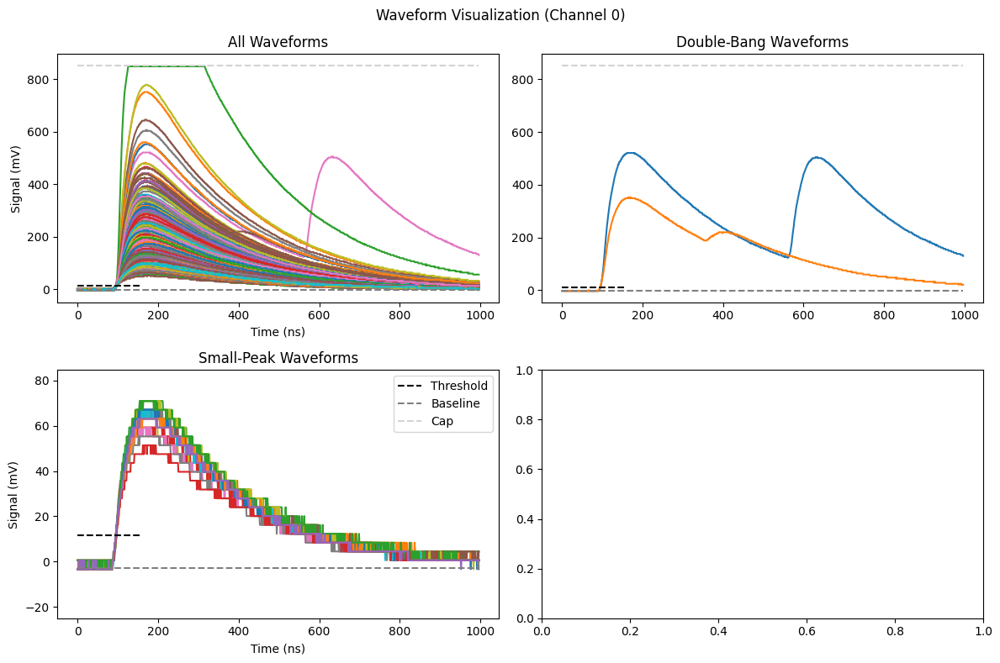

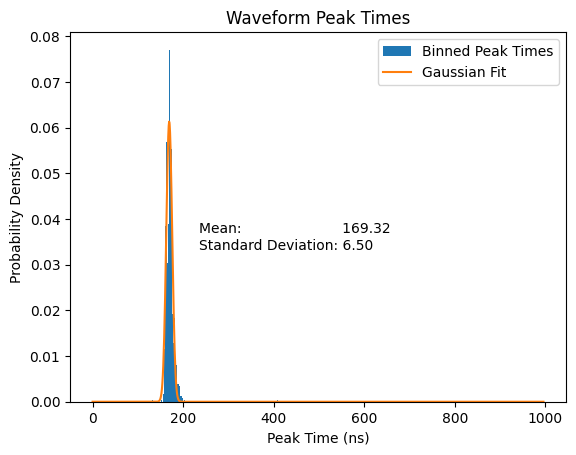

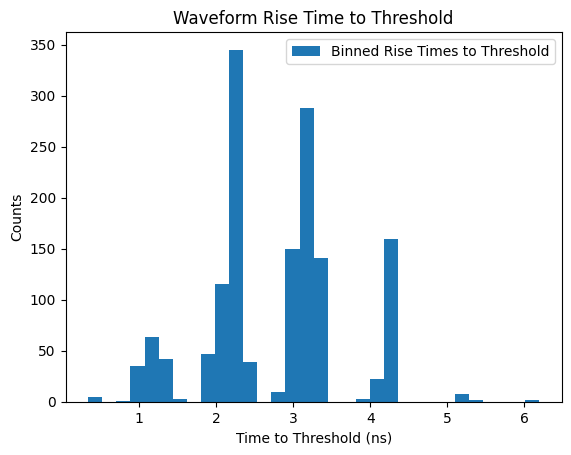

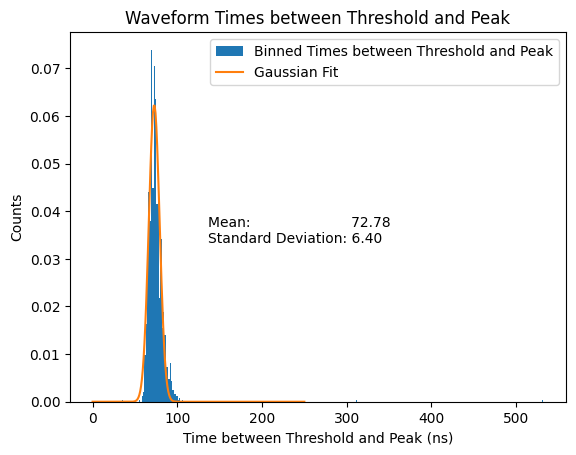

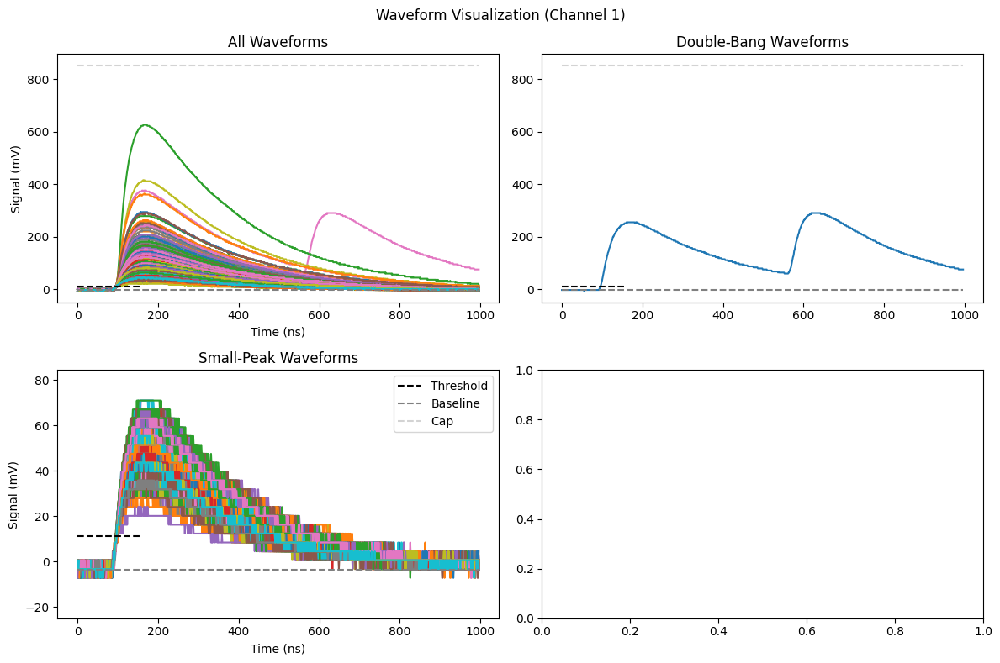

...

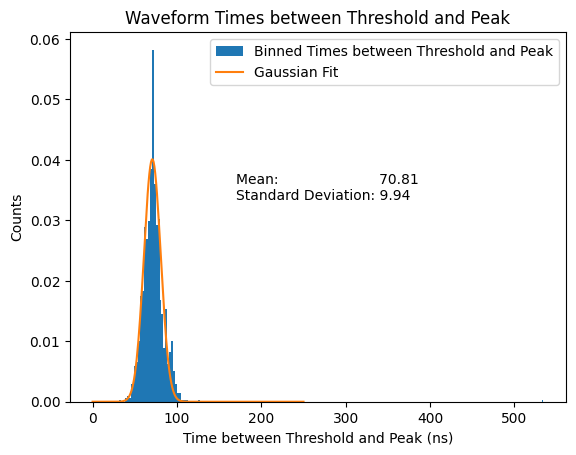

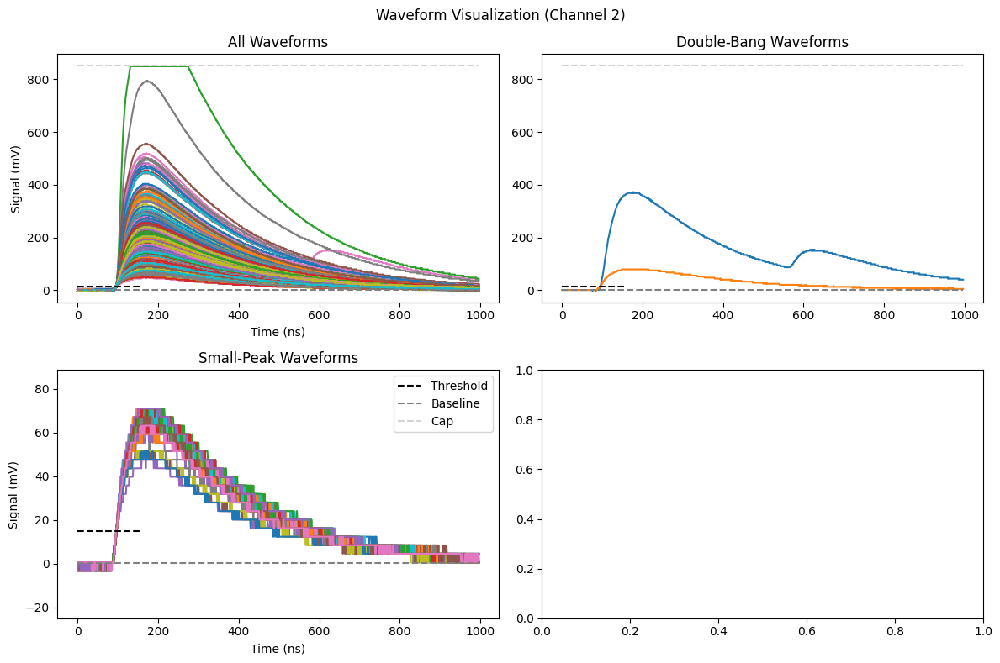

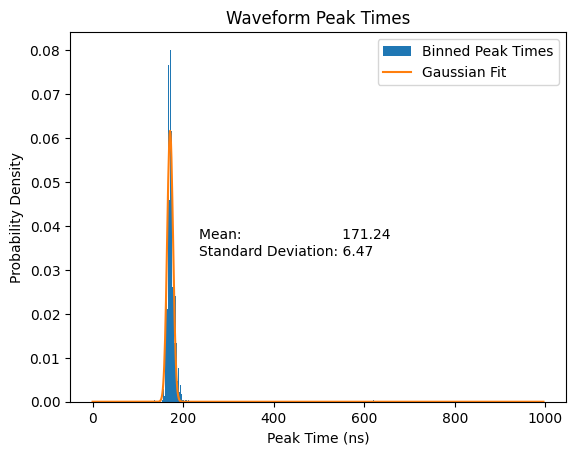

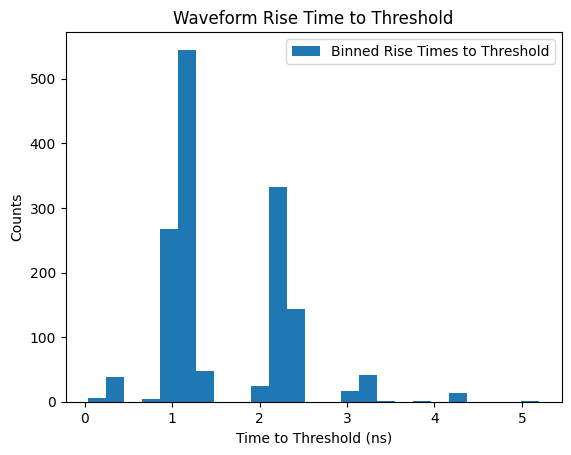

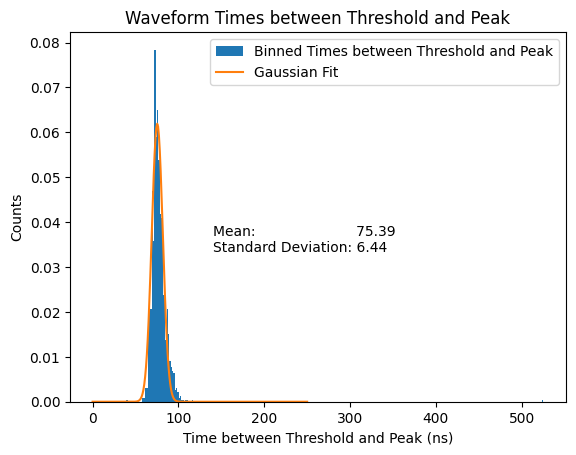

In [13]:
visualize_waveforms(base_file0, channel = 0,digitizer_offset_pct=14.8)
visualize_waveforms(base_file1, channel = 1,digitizer_offset_pct=14.8)
visualize_waveforms(base_file2, channel = 2,digitizer_offset_pct=14.8)

# Varied Threshold with 8 ns Coincidence Window
### Test 69
| Parameter | Value |
| :--- | ---: |
| Duration | 600 s |
| Record Length | 996 ns |
| Pre-trigger | 96 ns |
| Threshold | 10 LSB |
| Trigger Holdoff | 896 ns |
| Energy Coarse Gain | 40 fC/LSB |
| Gate | 800 ns |
| Short Gate | 80 ns |
| Pre-Gate | 15 ns |
| Coincidence Window | 8 ns |

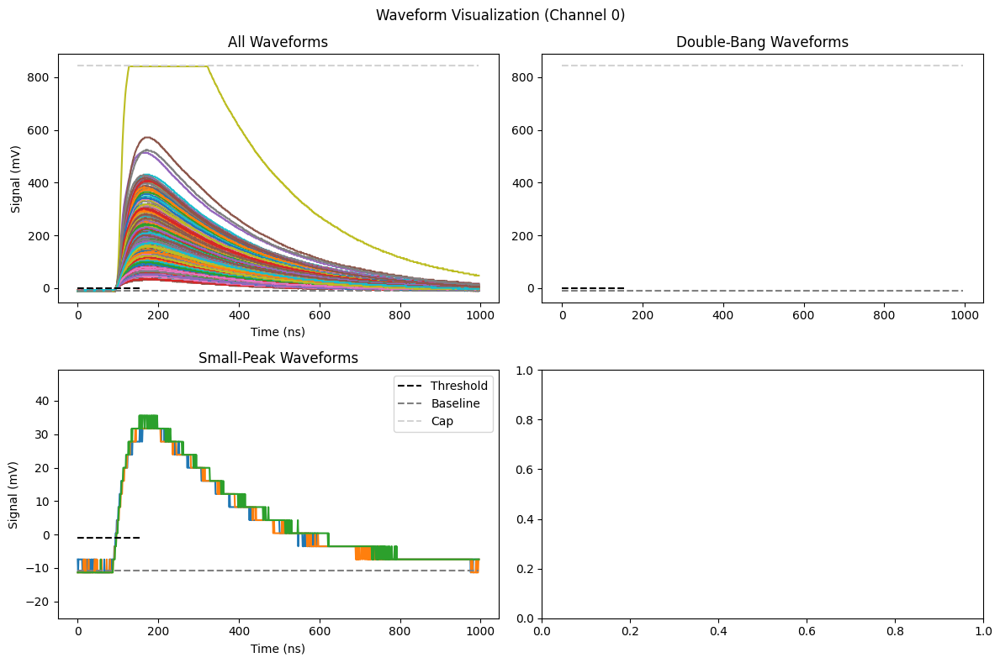

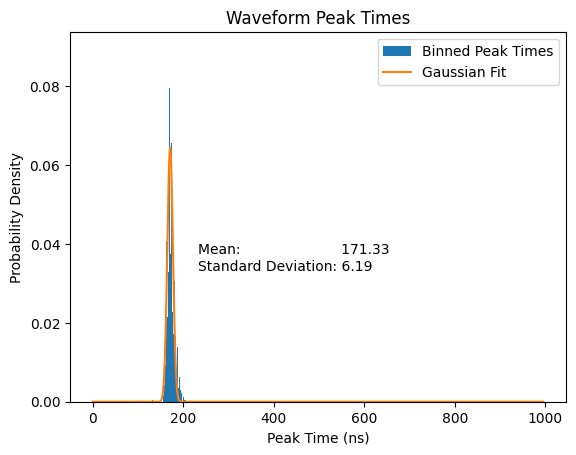

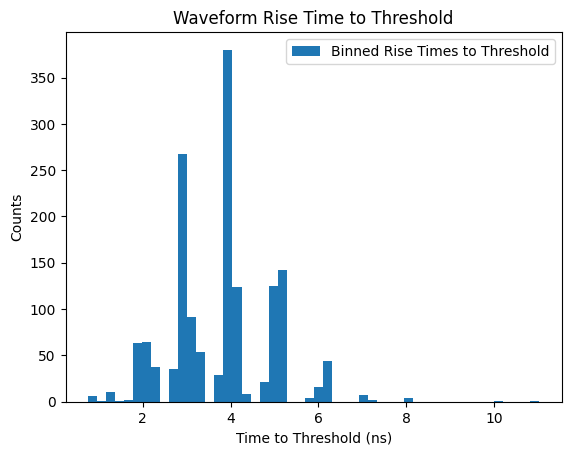

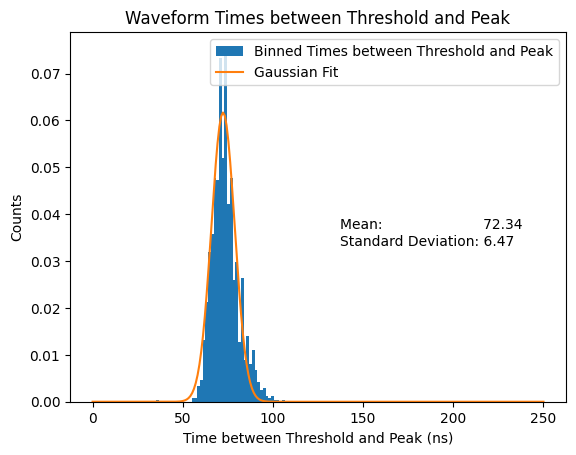

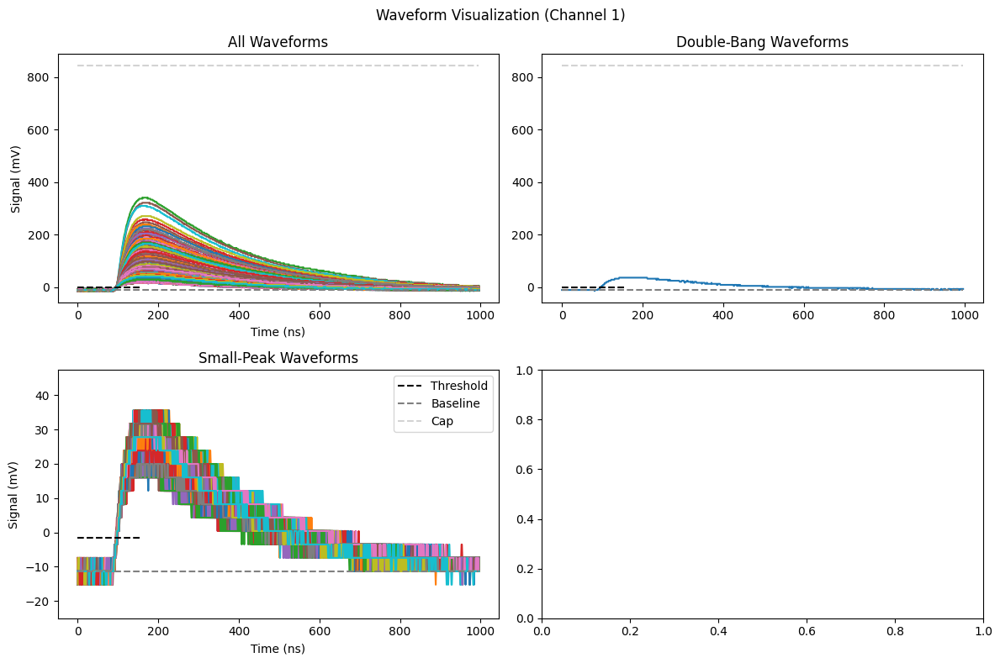

...

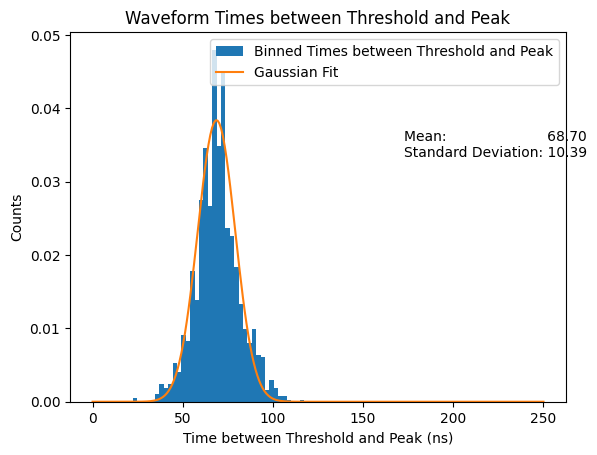

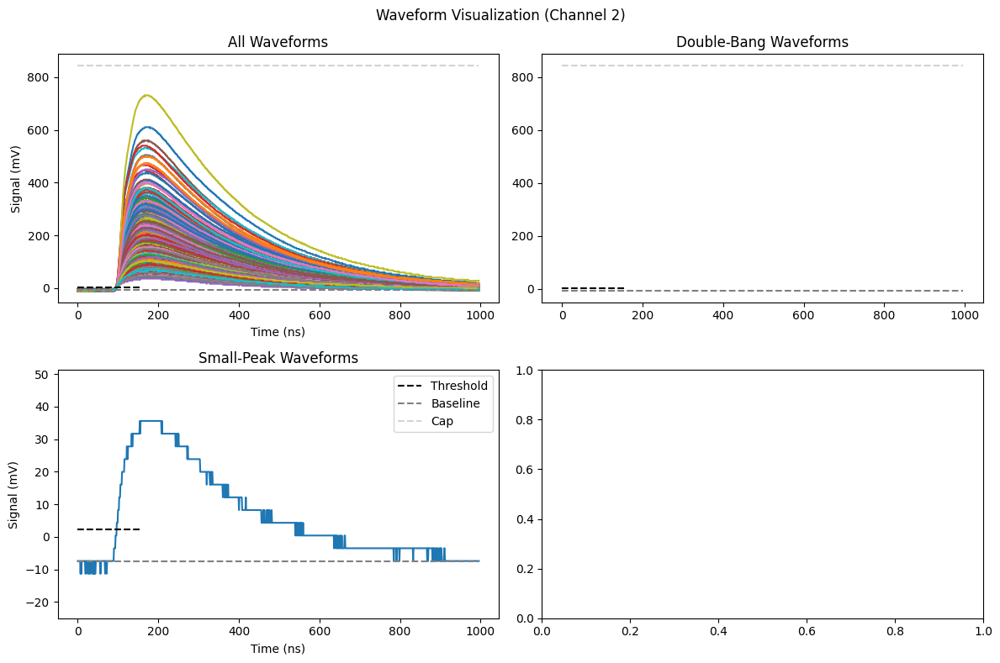

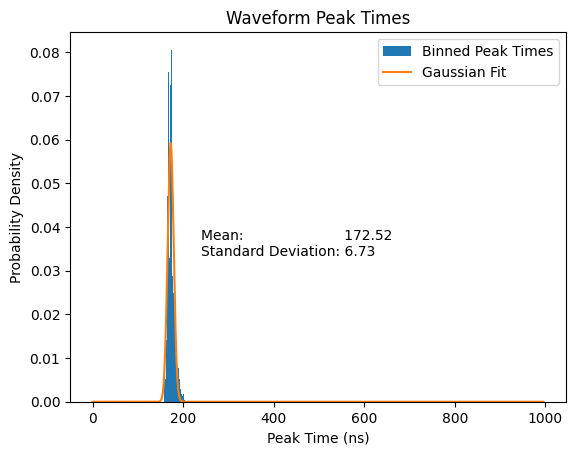

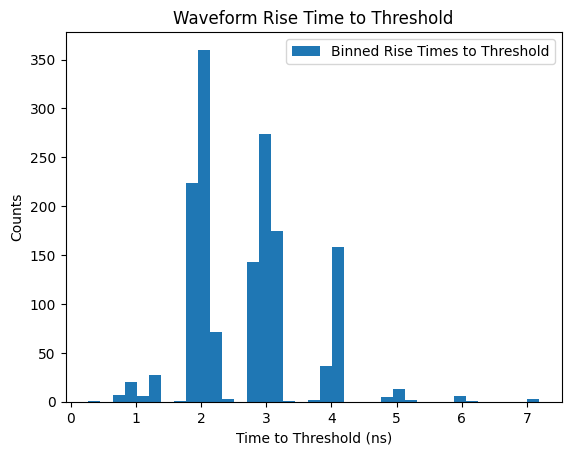

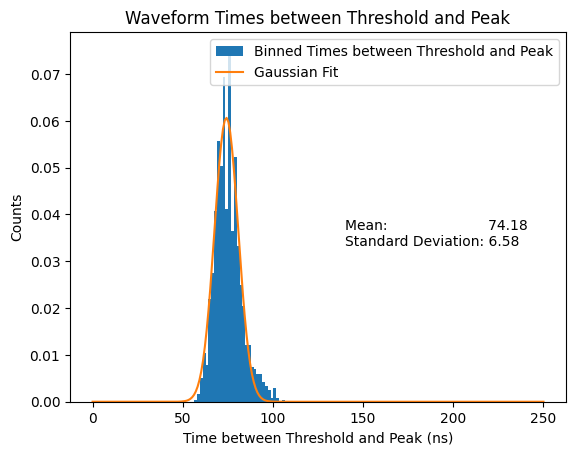

In [14]:
for ch in range(3):
   visualize_waveforms(f"test_69/RAW/DataR_CH{ch}@DT5751_1616_test_69.root", thresh = 10, channel = ch)

### Test 70
| Parameter | Value |
| :--- | ---: |
| Duration | 600 s |
| Record Length | 996 ns |
| Pre-trigger | 96 ns |
| Threshold | 5 LSB |
| Trigger Holdoff | 896 ns |
| Energy Coarse Gain | 40 fC/LSB |
| Gate | 800 ns |
| Short Gate | 80 ns |
| Pre-Gate | 15 ns |
| Coincidence Window | 8 ns |

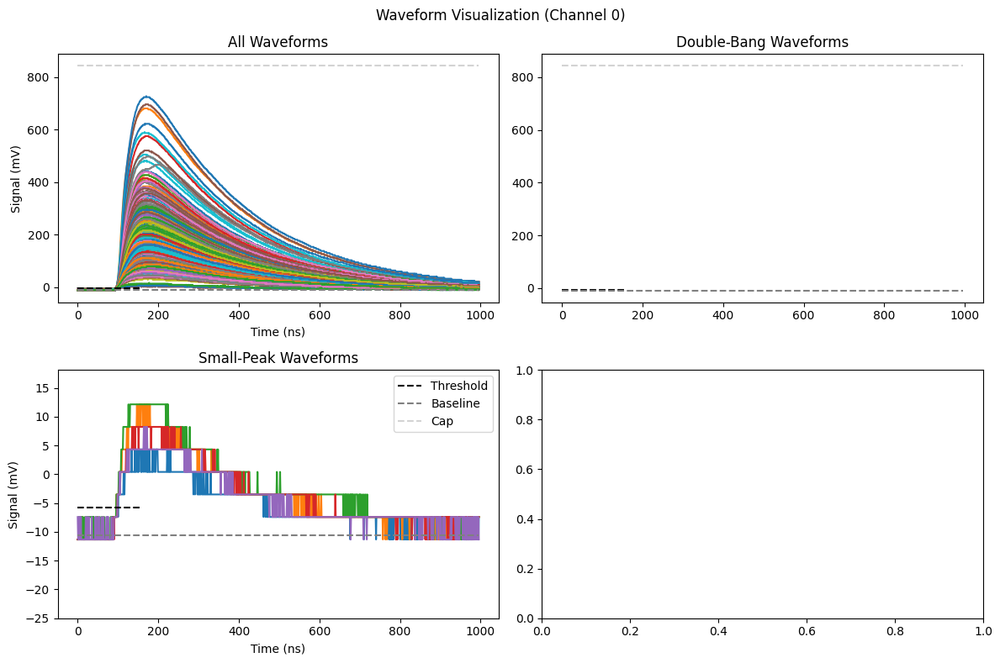

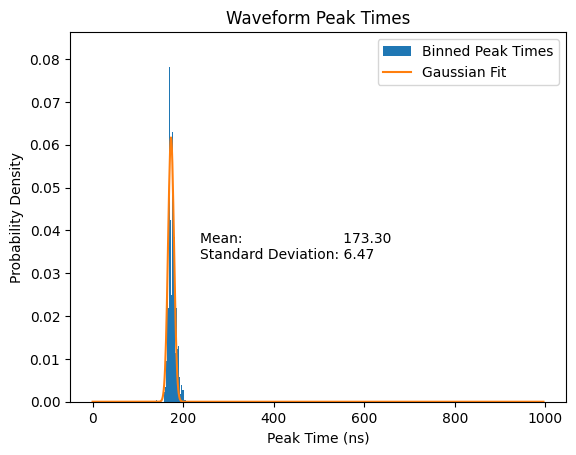

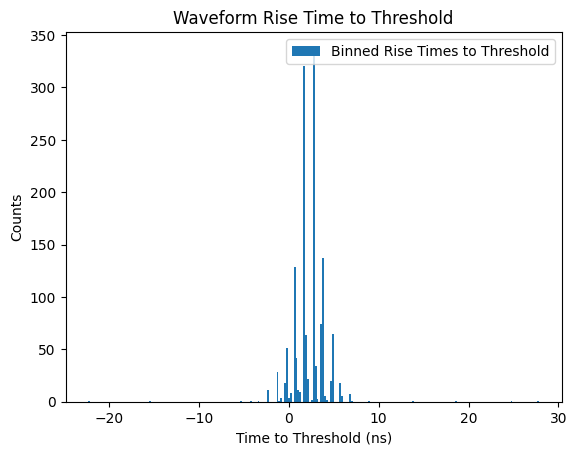

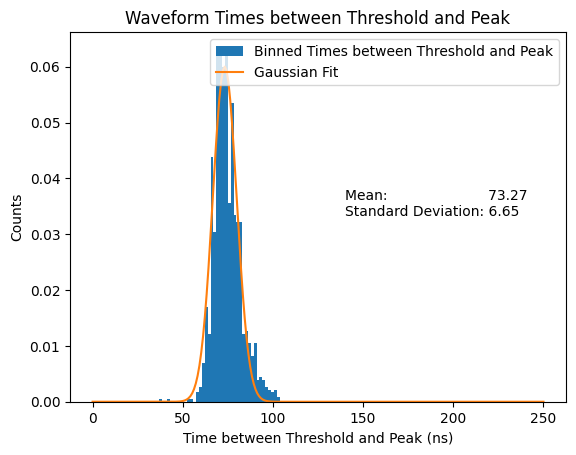

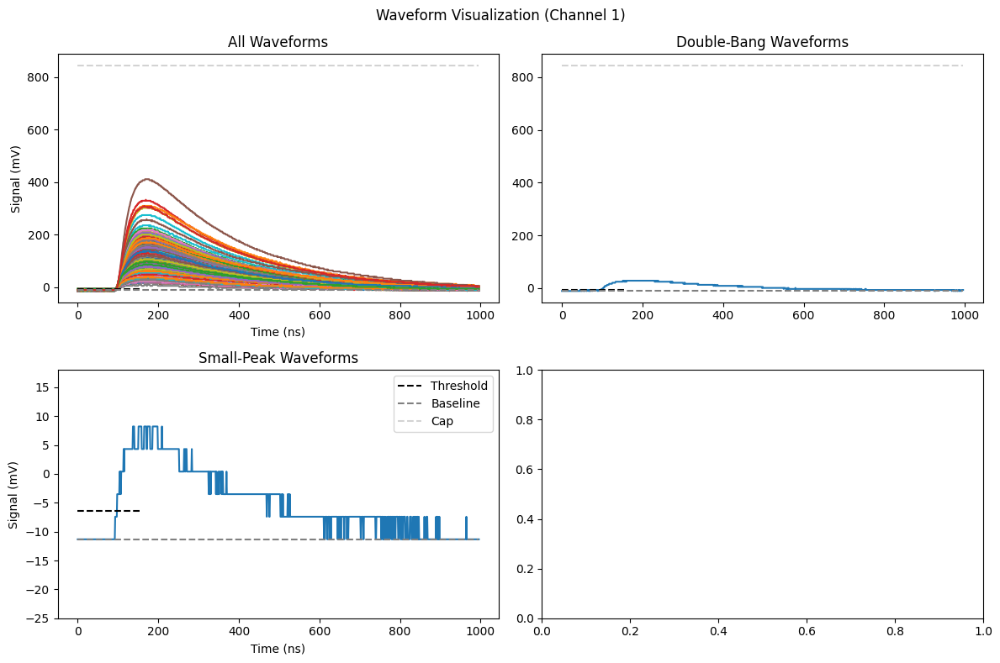

...

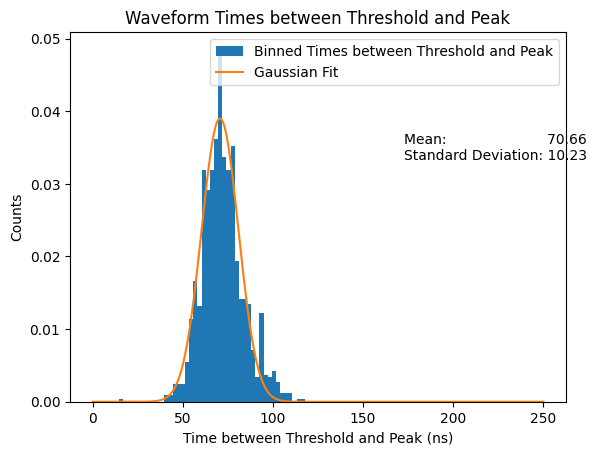

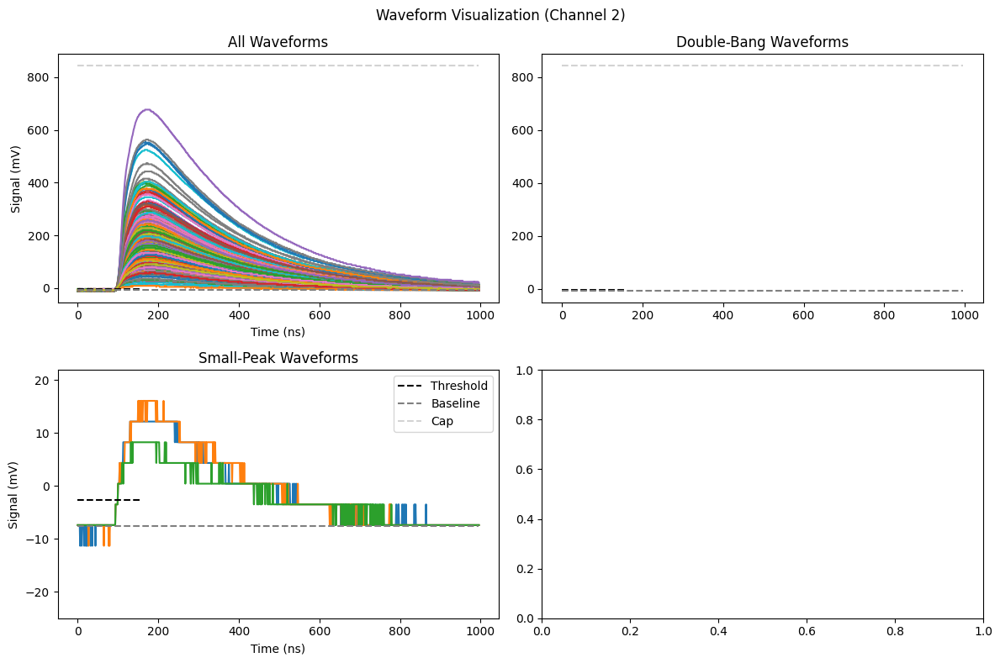

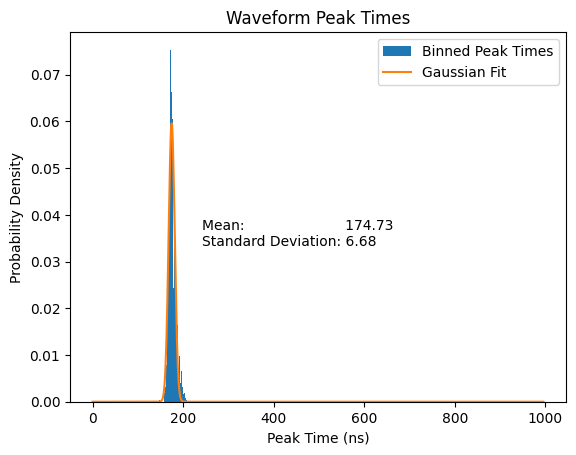

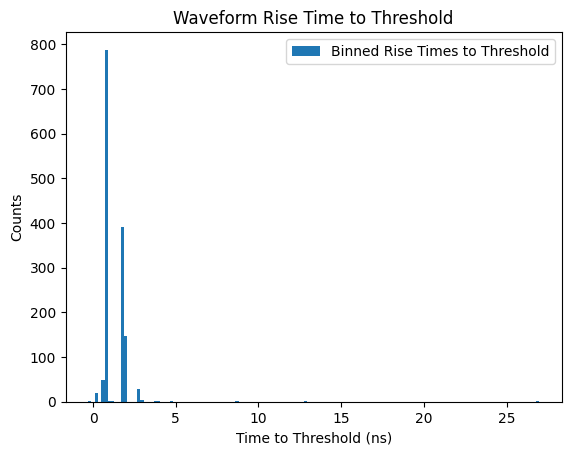

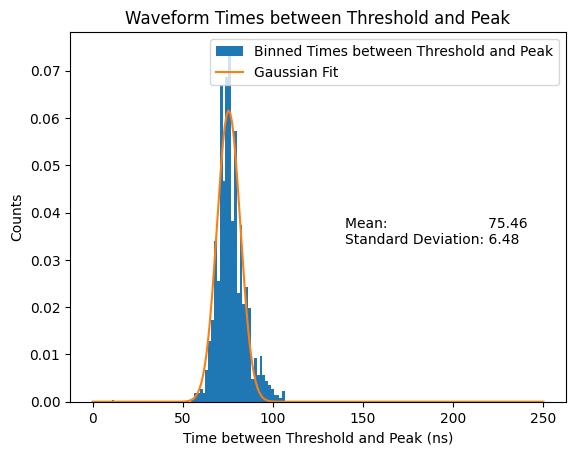

In [ ]:
for ch in range(3):
   visualize_waveforms(f"test_70/RAW/DataR_CH{ch}@DT5751_1616_test_70.root", thresh=5, channel = ch)

# Varied Threshold with 16 ns Coincidence Window
### Test 74
| Parameter | Value |
| :--- | ---: |
| Duration | 600 s |
| Record Length | 996 ns |
| Pre-trigger | 96 ns |
| Threshold | 15 LSB |
| Trigger Holdoff | 896 ns |
| Energy Coarse Gain | 40 fC/LSB |
| Gate | 800 ns |
| Short Gate | 80 ns |
| Pre-Gate | 15 ns |
| Coincidence Window | 16 ns |

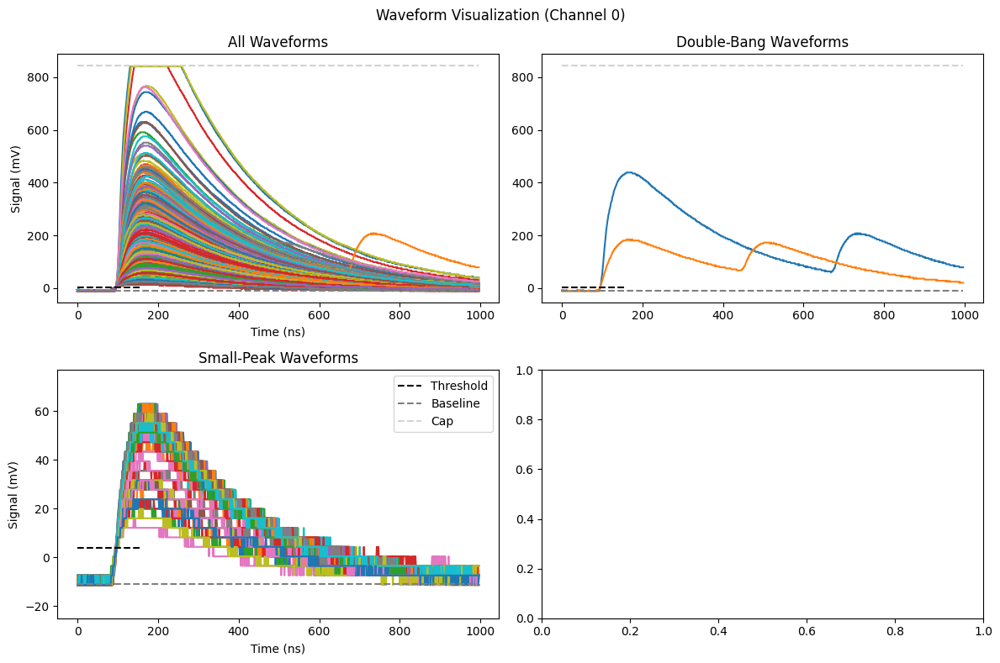

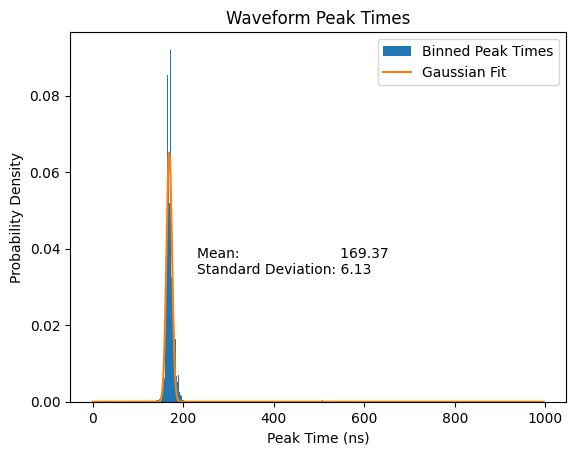

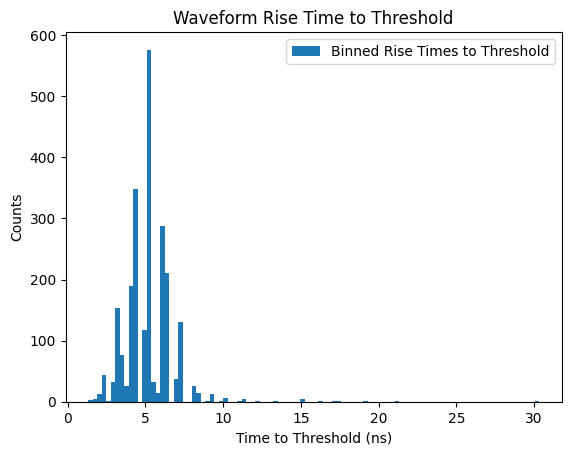

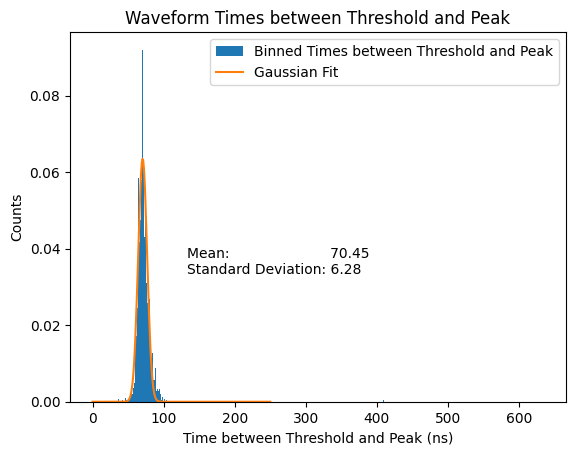

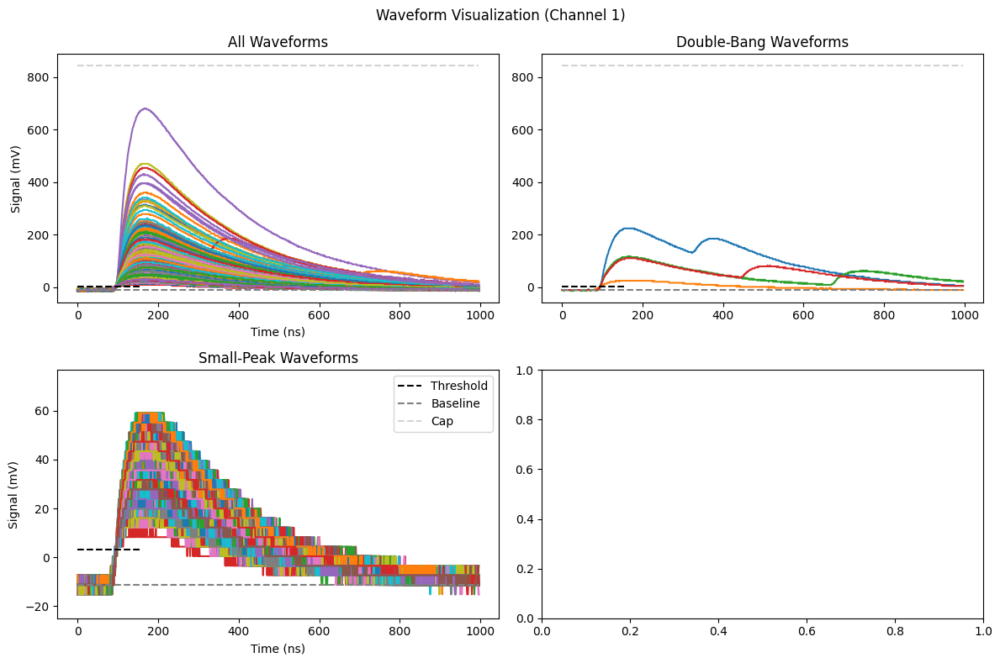

...

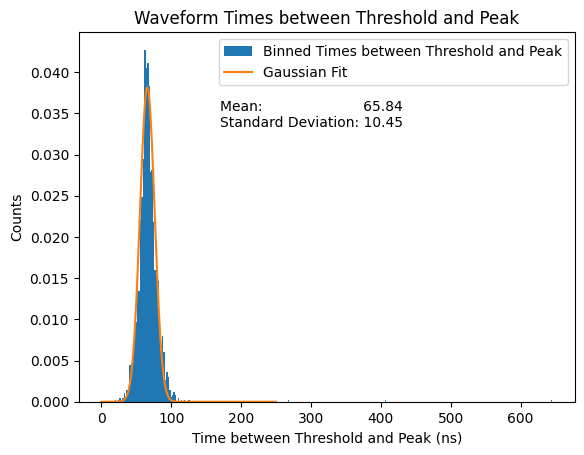

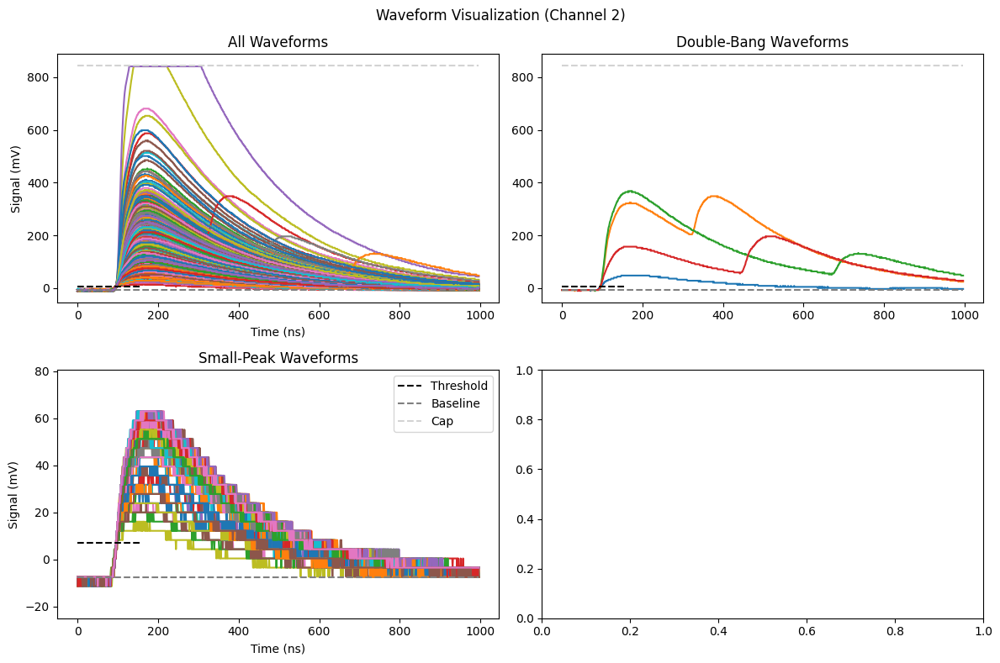

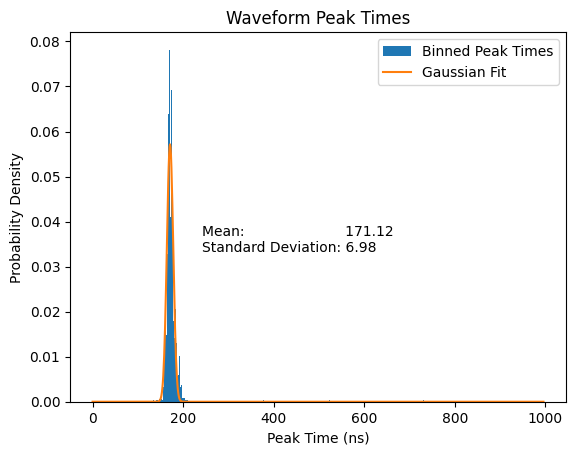

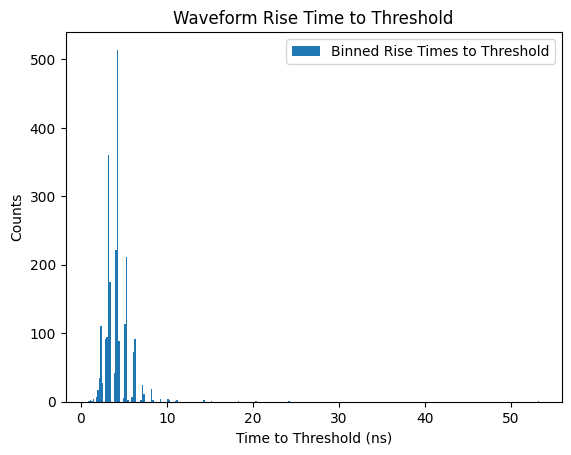

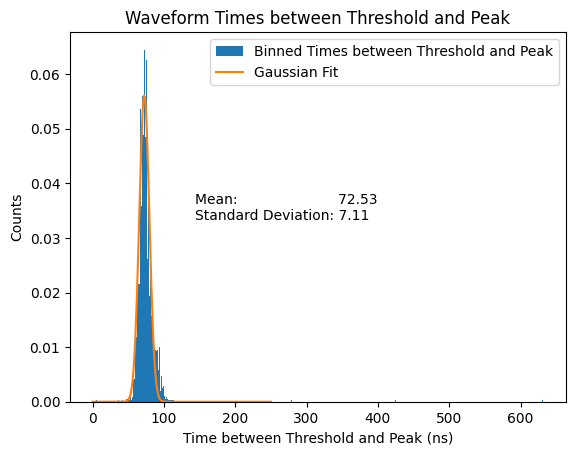

In [ ]:
for ch in range(3):
   visualize_waveforms(f"test_74/RAW/DataR_CH{ch}@DT5751_1616_test_74.root", thresh = 15, channel = ch)

### Test 75
| Parameter | Value |
| :--- | ---: |
| Duration | 600 s |
| Record Length | 996 ns |
| Pre-trigger | 96 ns |
| Threshold | 20 LSB |
| Trigger Holdoff | 896 ns |
| Energy Coarse Gain | 40 fC/LSB |
| Gate | 800 ns |
| Short Gate | 80 ns |
| Pre-Gate | 15 ns |
| Coincidence Window | 16 ns |

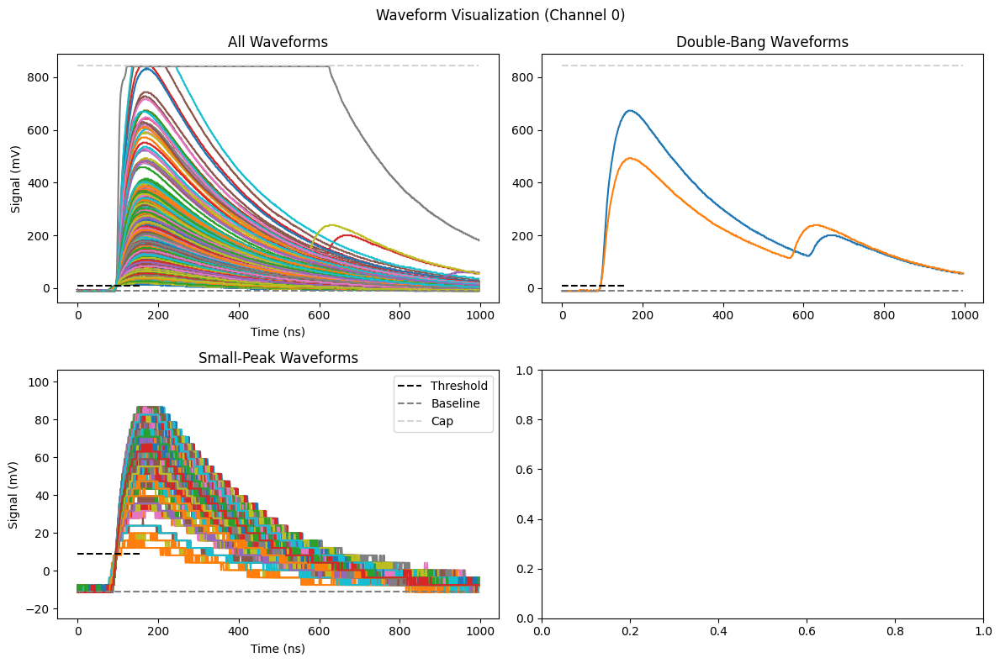

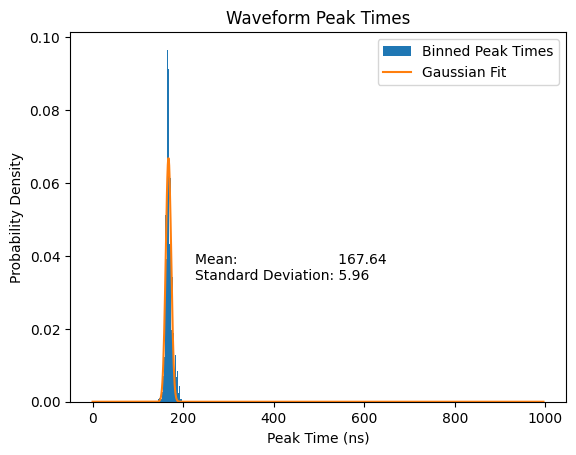

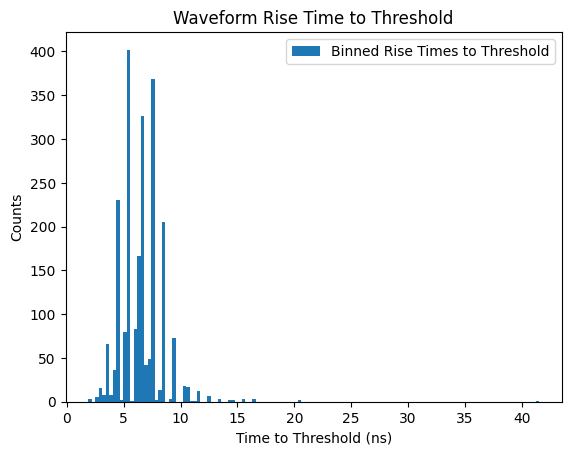

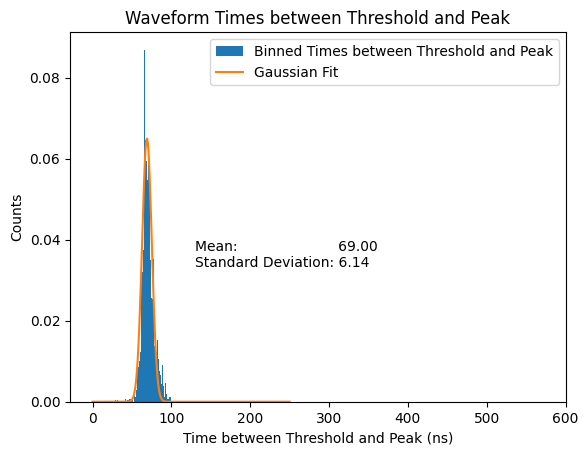

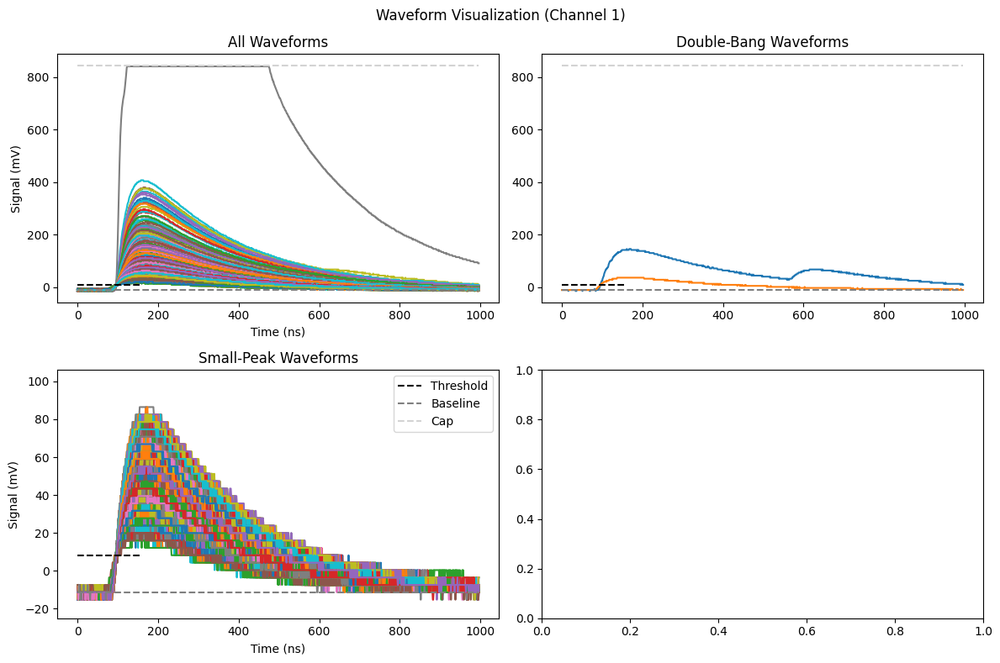

...

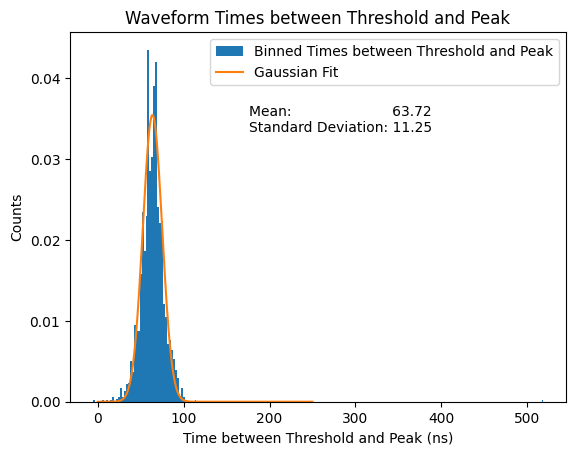

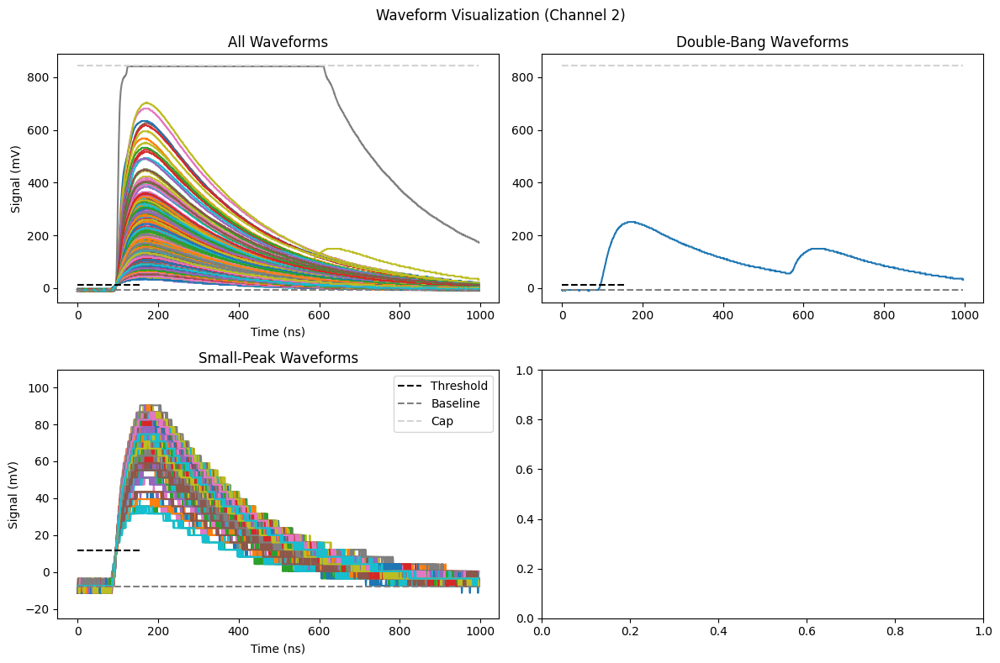

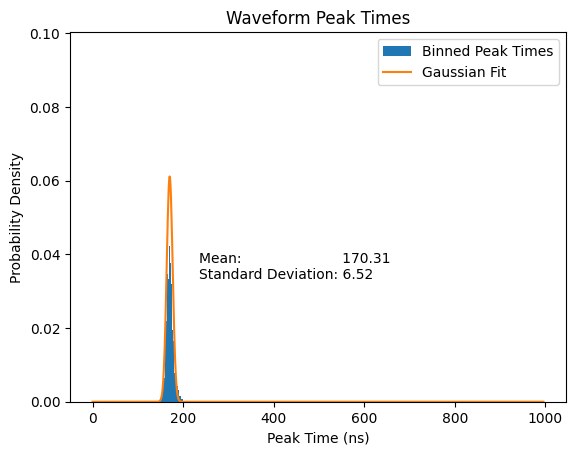

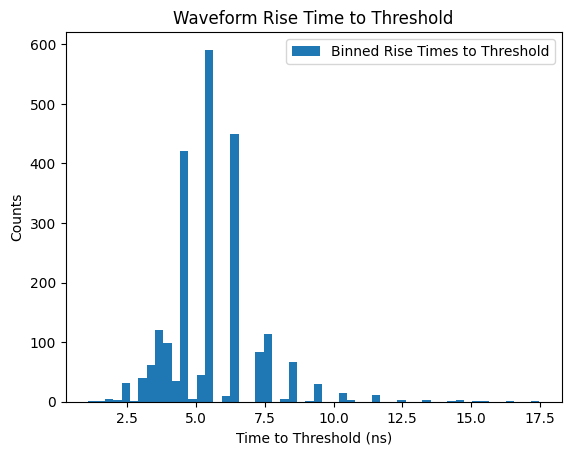

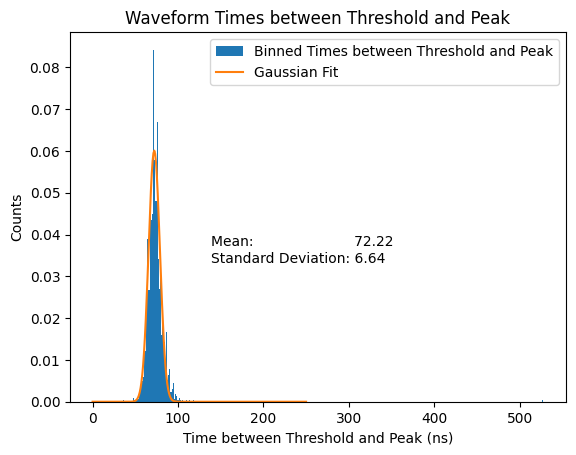

In [ ]:
for ch in range(3):
   visualize_waveforms(f"test_75/RAW/DataR_CH{ch}@DT5751_1616_test_75.root", thresh=20, channel = ch)

### Test 73
| Parameter | Value |
| :--- | ---: |
| Duration | 600 s |
| Record Length | 996 ns |
| Pre-trigger | 96 ns |
| Threshold | 25 LSB |
| Trigger Holdoff | 896 ns |
| Energy Coarse Gain | 40 fC/LSB |
| Gate | 800 ns |
| Short Gate | 80 ns |
| Pre-Gate | 15 ns |
| Coincidence Window | 16 ns |

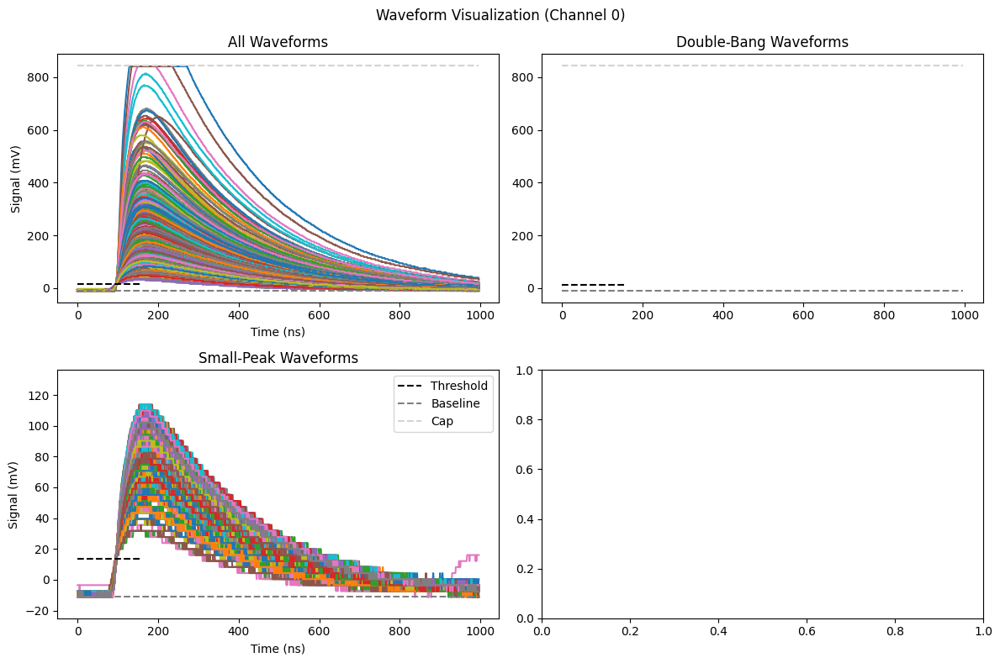

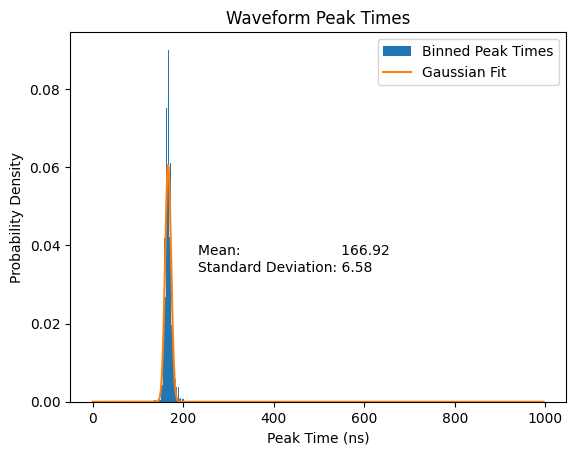

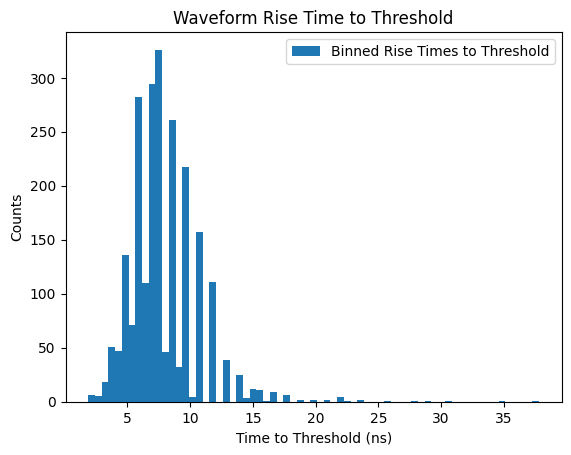

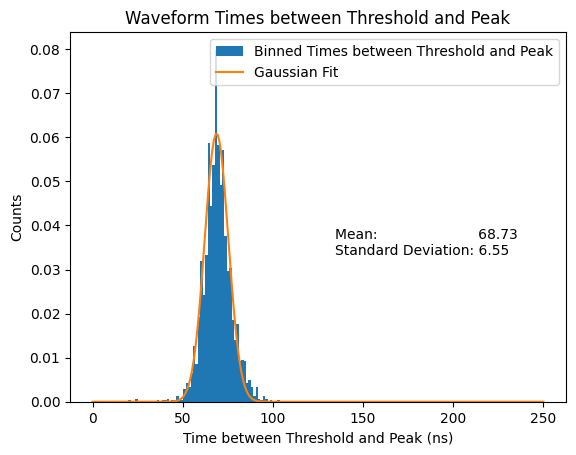

/Users/BEAVERMAN/PONE/mist-characterization-optimization/.venv/lib/python3.14/site-packages/scipy/optimize/_root_scalar.py:327: RuntimeWarning: Derivative was zero.
  r, sol = methodc(f, x0, args=args, fprime=fprime, fprime2=None,


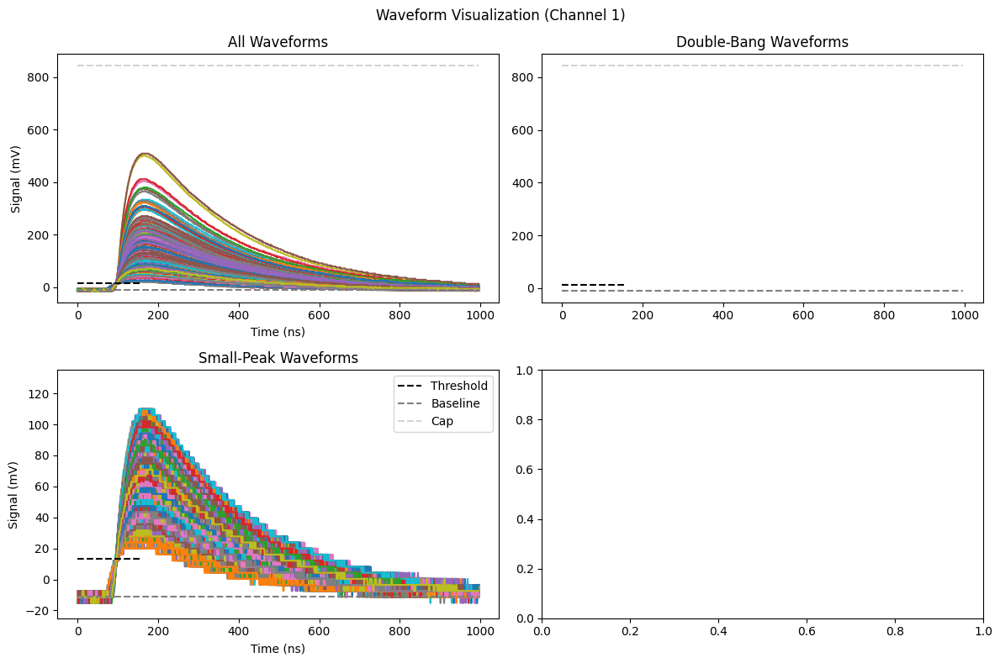

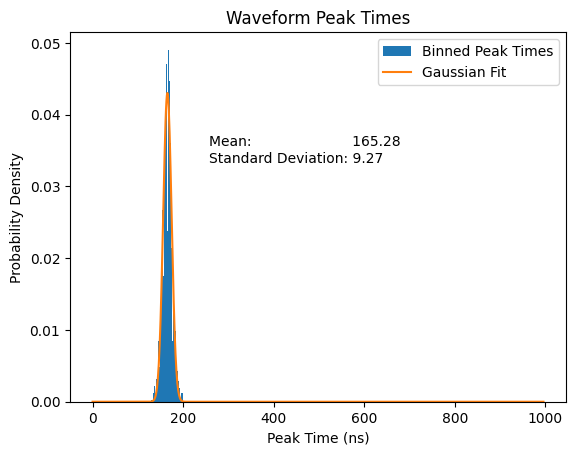

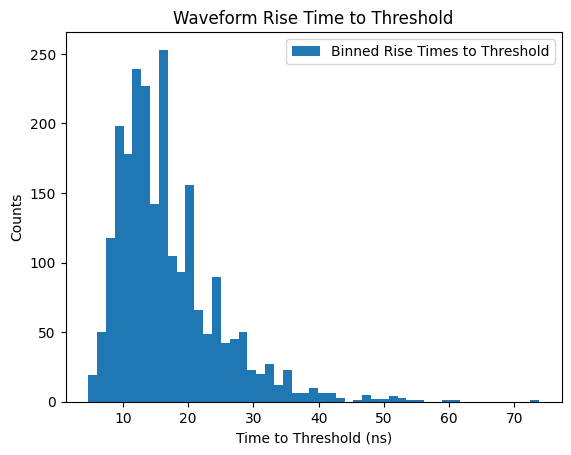

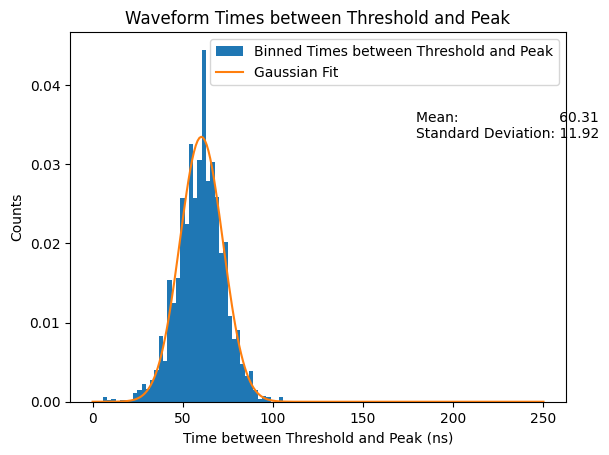

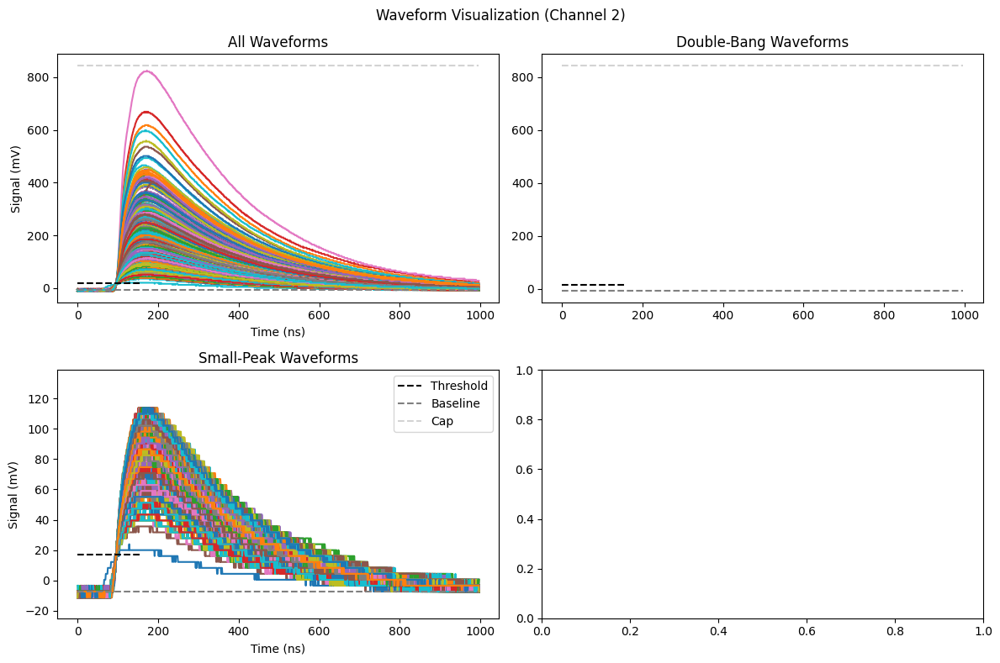

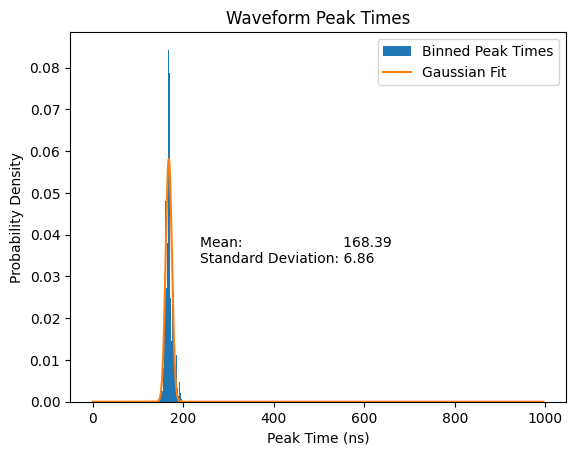

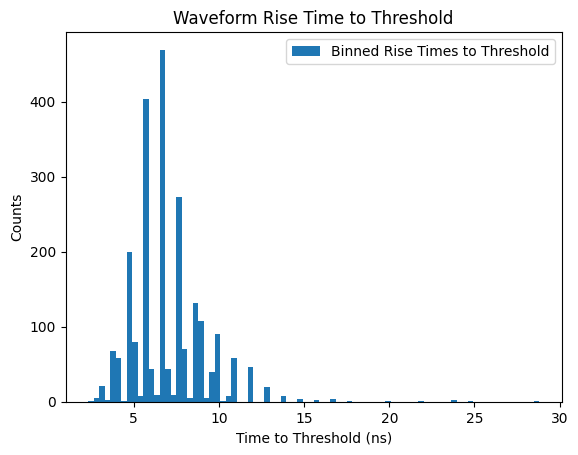

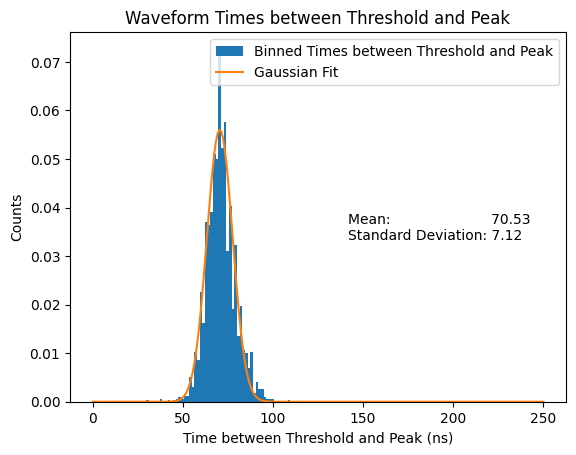

In [ ]:
for ch in range(3):
   visualize_waveforms(f"test_73/RAW/DataR_CH{ch}@DT5751_1616_test_73.root", thresh=25, channel = ch)

# Varied Threshold with 32 ns Coincidence Window
### Test 68
| Parameter | Value |
| :--- | ---: |
| Duration | 600 s |
| Record Length | 996 ns |
| Pre-trigger | 96 ns |
| Threshold | 15 LSB |
| Trigger Holdoff | 896 ns |
| Energy Coarse Gain | 40 fC/LSB |
| Gate | 800 ns |
| Short Gate | 80 ns |
| Pre-Gate | 15 ns |
| Coincidence Window | 32 ns |

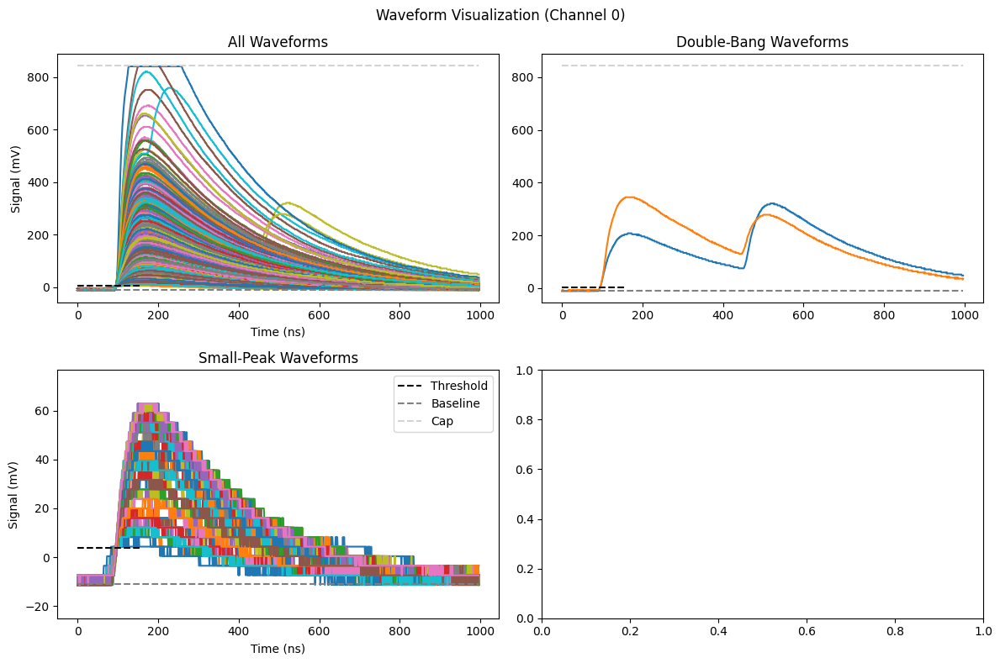

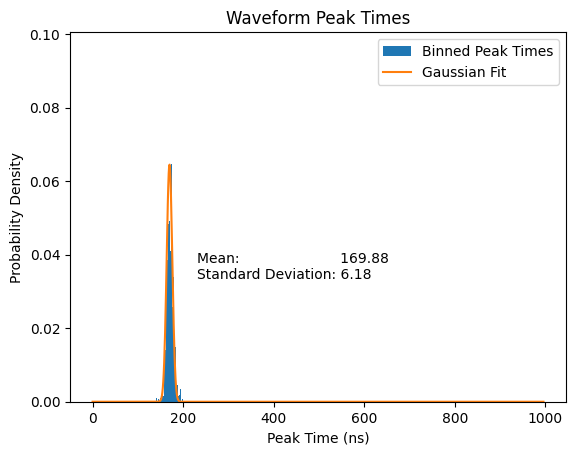

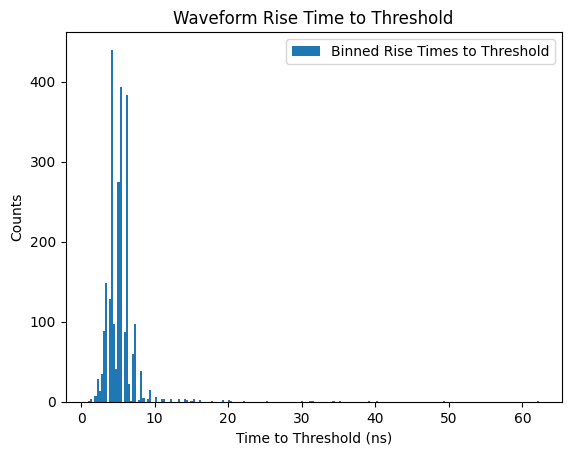

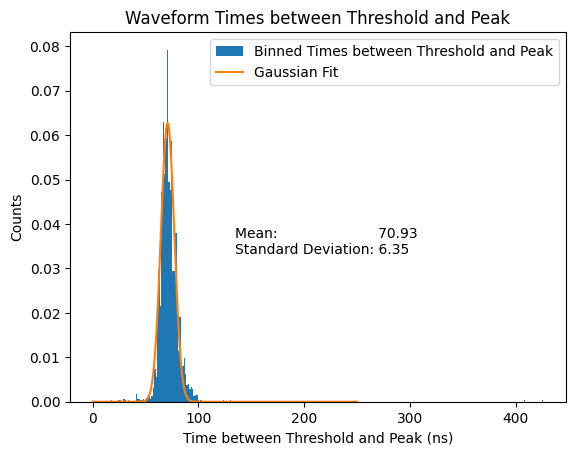

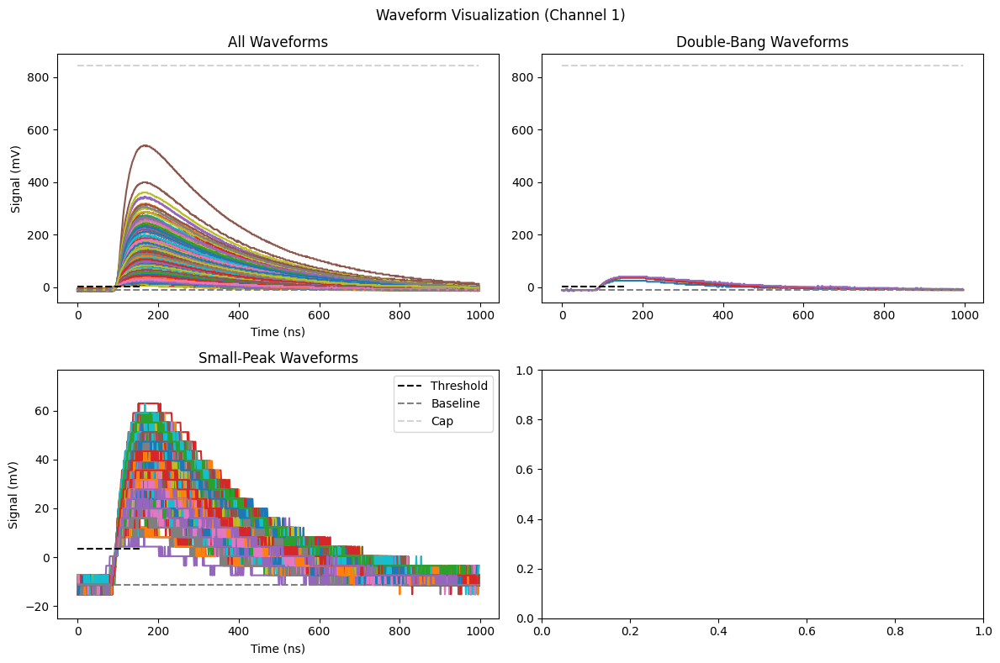

...

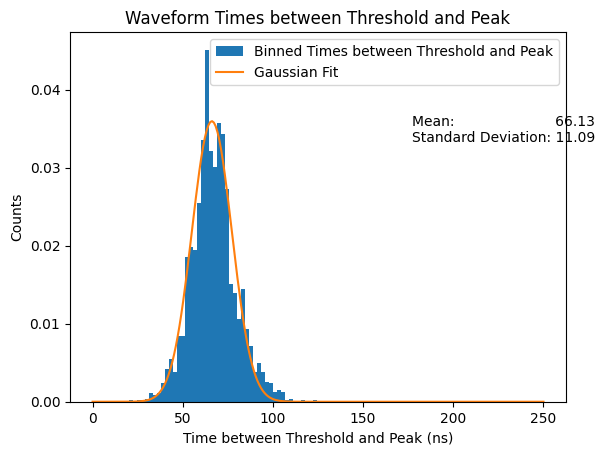

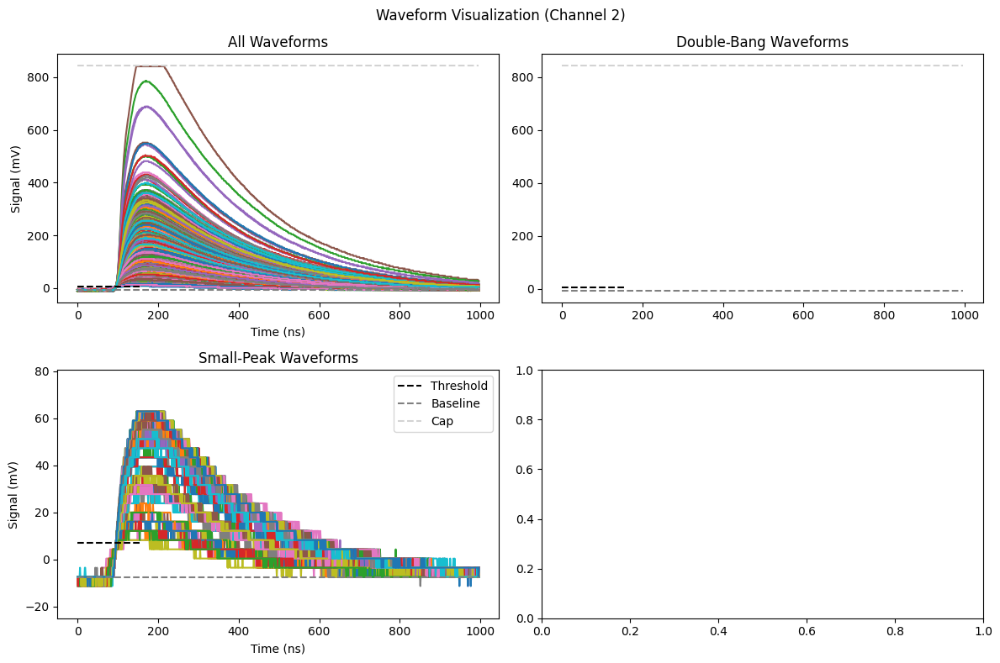

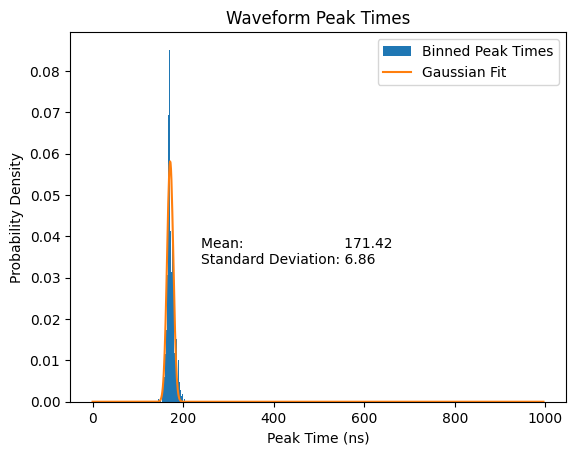

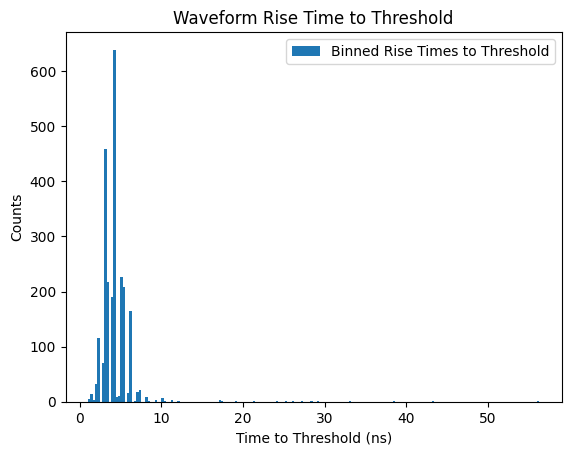

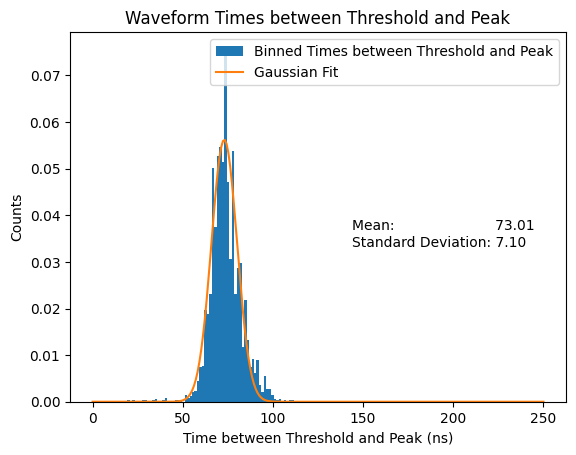

In [ ]:
for ch in range(3):
   visualize_waveforms(f"test_68/RAW/DataR_CH{ch}@DT5751_1616_test_68.root", thresh = 15, channel = ch)

### Test 71
| Parameter | Value |
| :--- | ---: |
| Duration | 600 s |
| Record Length | 996 ns |
| Pre-trigger | 96 ns |
| Threshold | 20 LSB |
| Trigger Holdoff | 896 ns |
| Energy Coarse Gain | 40 fC/LSB |
| Gate | 800 ns |
| Short Gate | 80 ns |
| Pre-Gate | 15 ns |
| Coincidence Window | 32 ns |

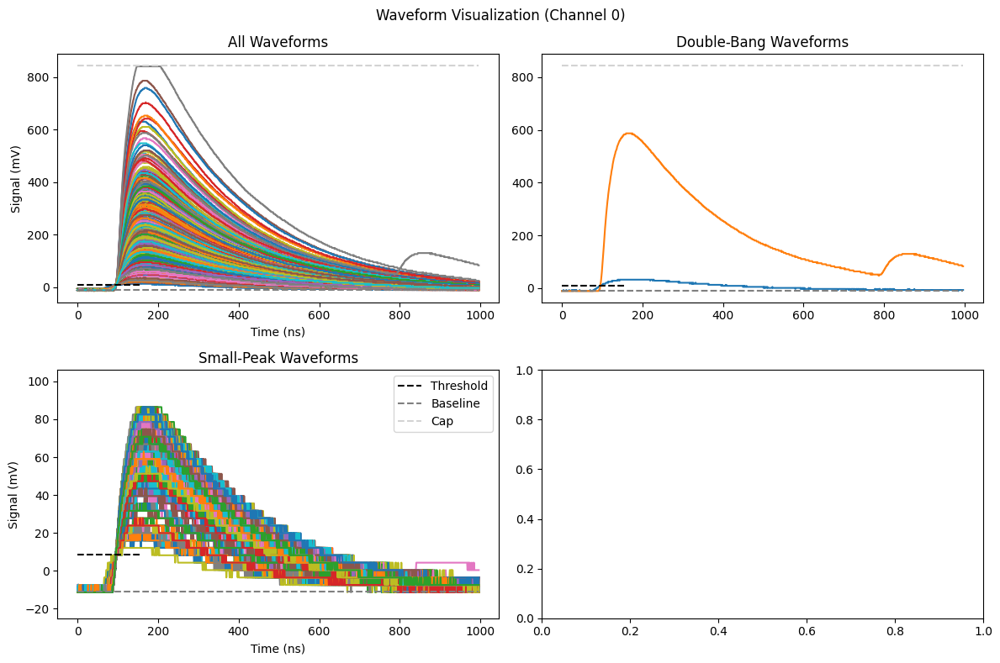

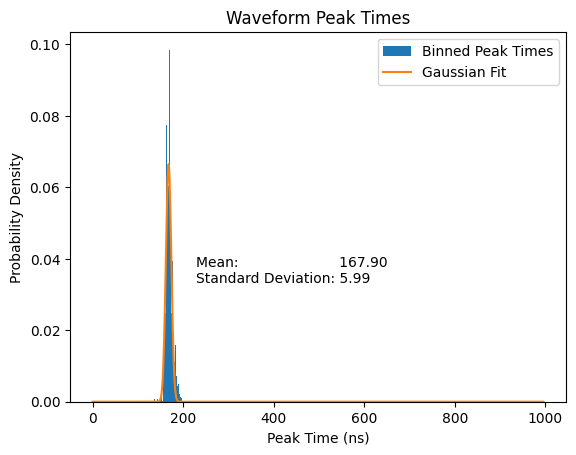

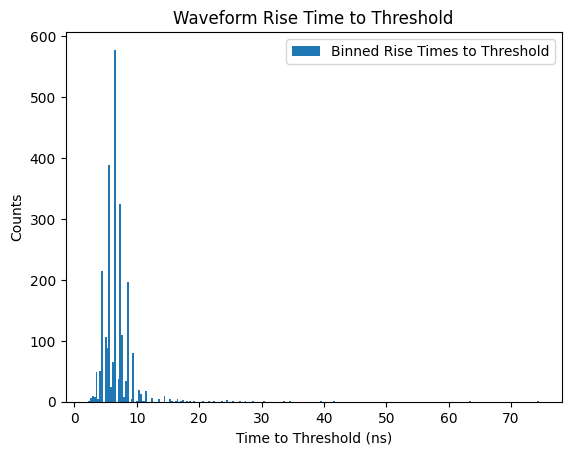

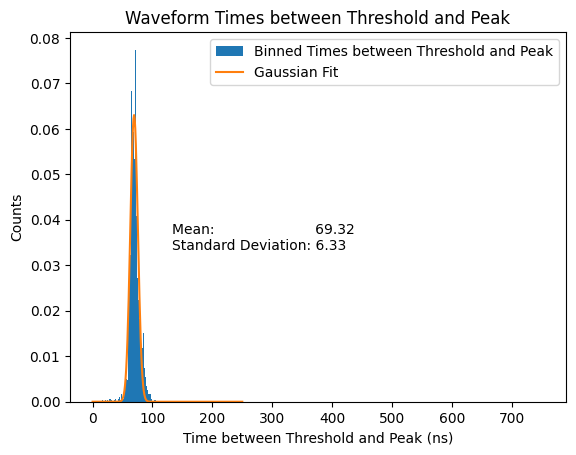

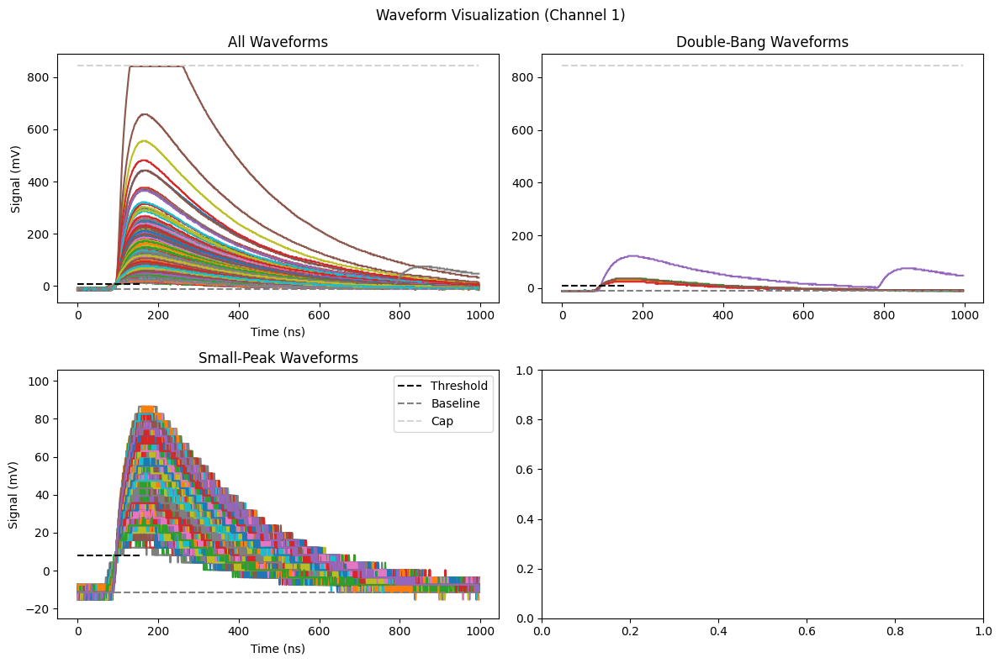

...

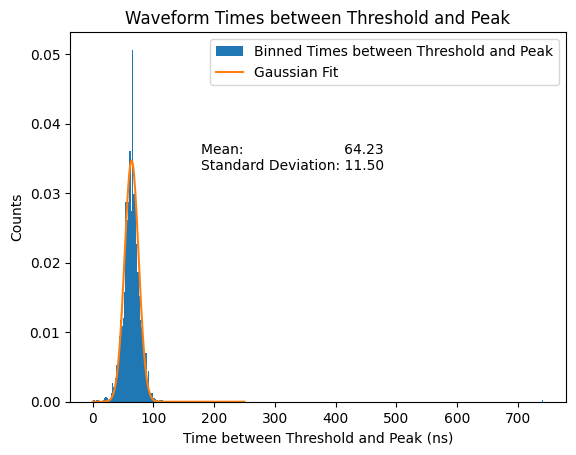

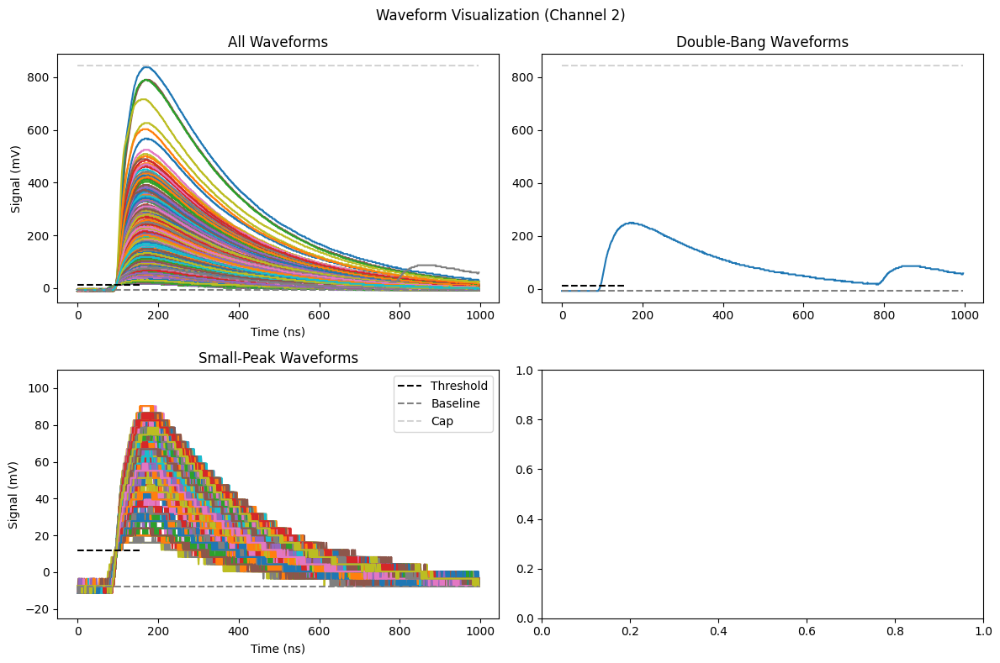

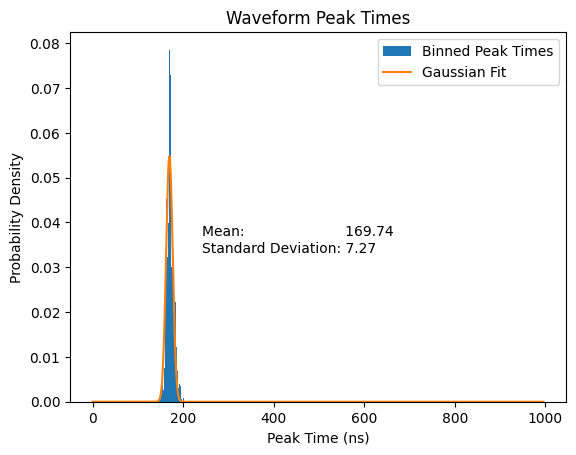

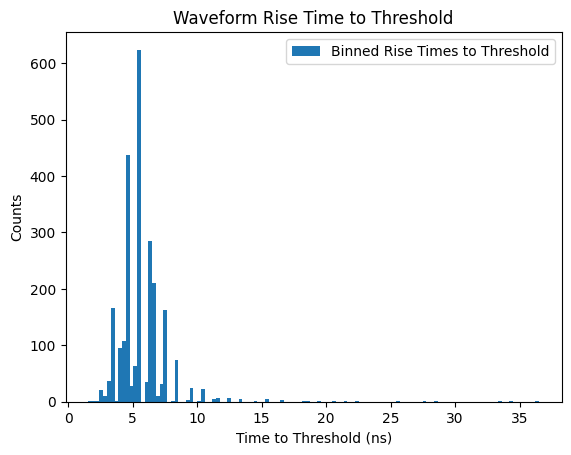

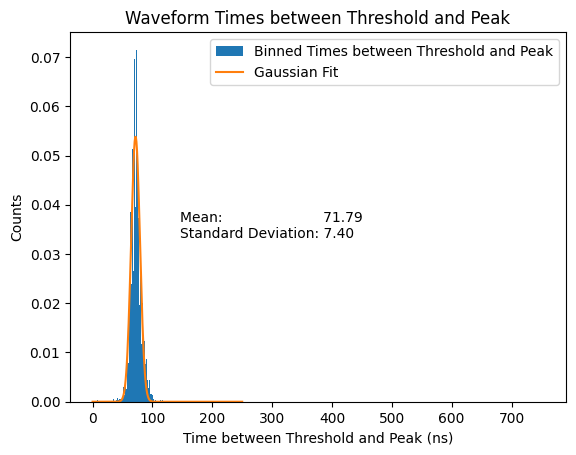

In [ ]:
for ch in range(3):
   visualize_waveforms(f"test_71/RAW/DataR_CH{ch}@DT5751_1616_test_71.root", thresh = 20, channel = ch)

### Test 72
| Parameter | Value |
| :--- | ---: |
| Duration | 600 s |
| Record Length | 996 ns |
| Pre-trigger | 96 ns |
| Threshold | 25 LSB |
| Trigger Holdoff | 896 ns |
| Energy Coarse Gain | 40 fC/LSB |
| Gate | 800 ns |
| Short Gate | 80 ns |
| Pre-Gate | 15 ns |
| Coincidence Window | 32 ns |

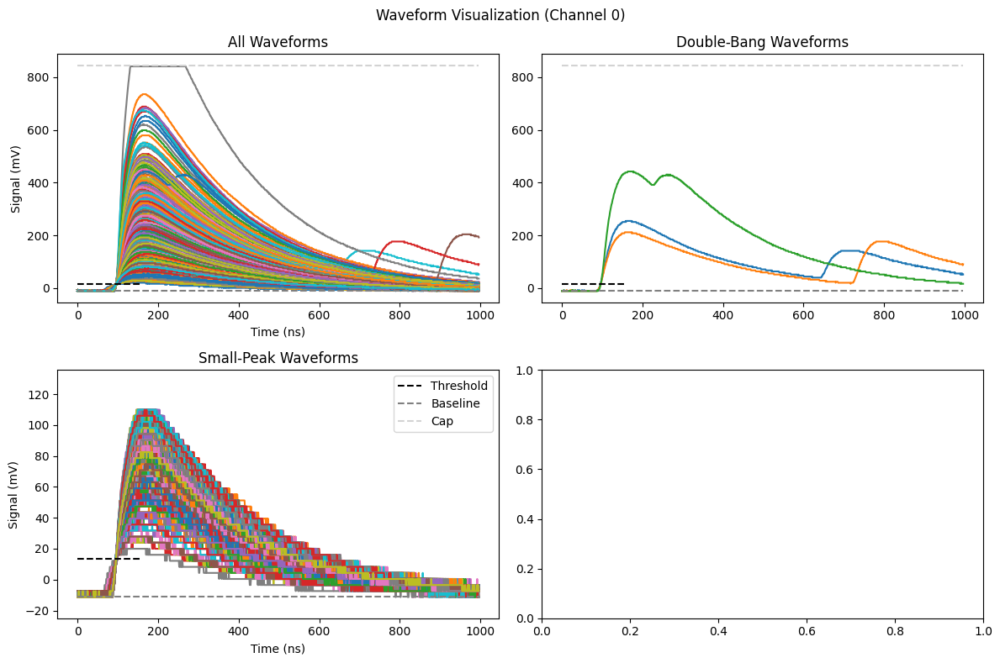

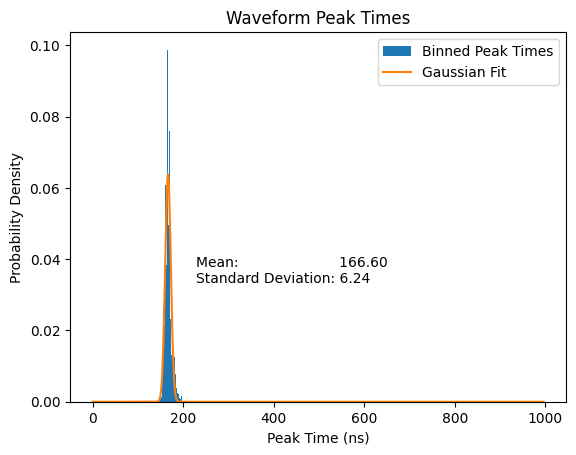

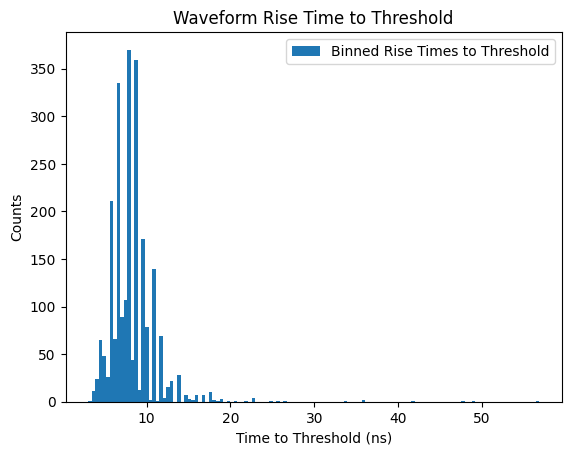

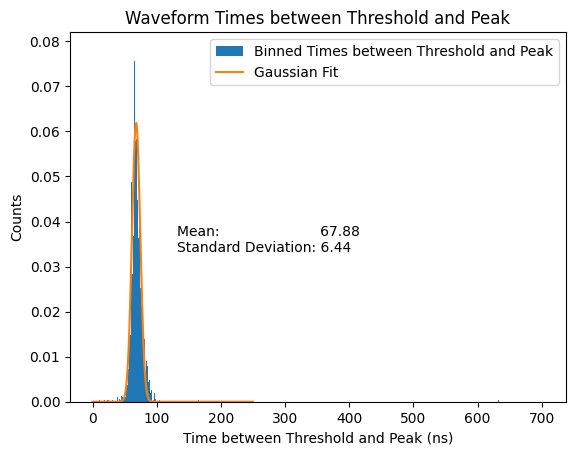

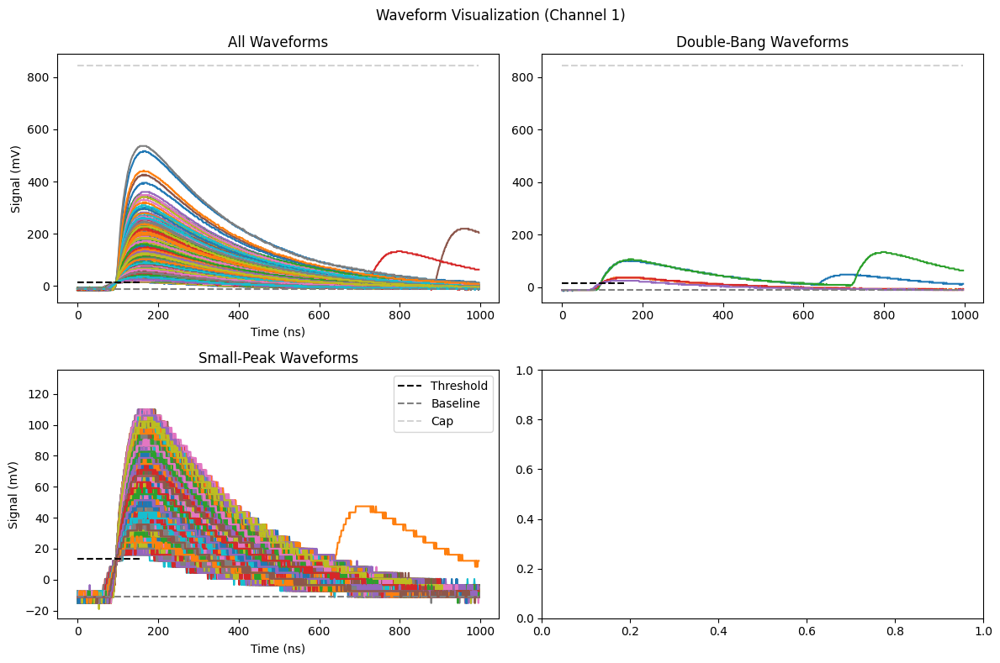

...

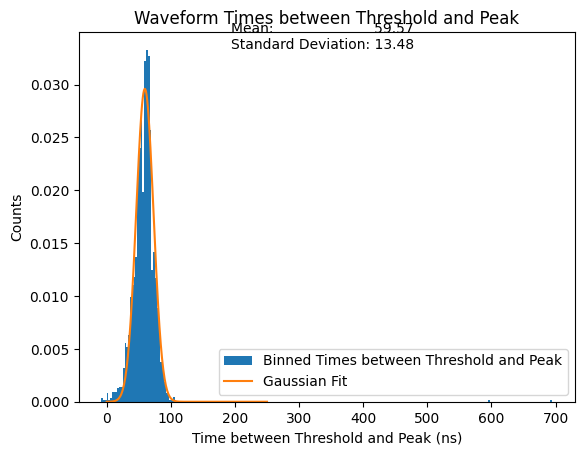

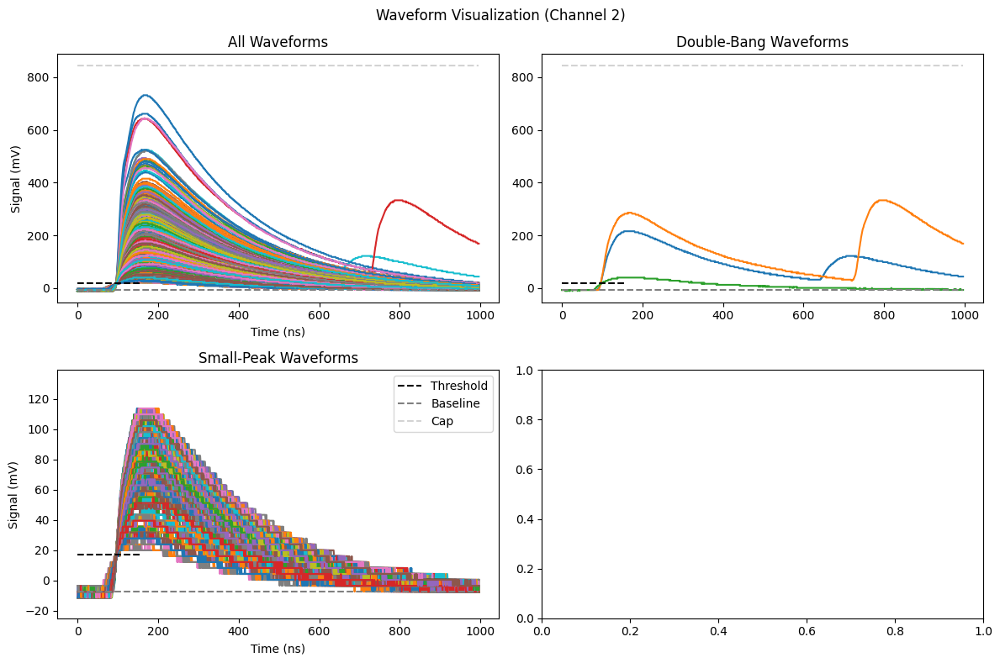

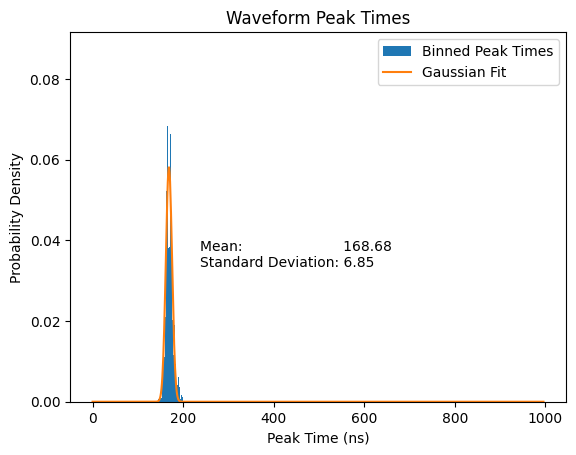

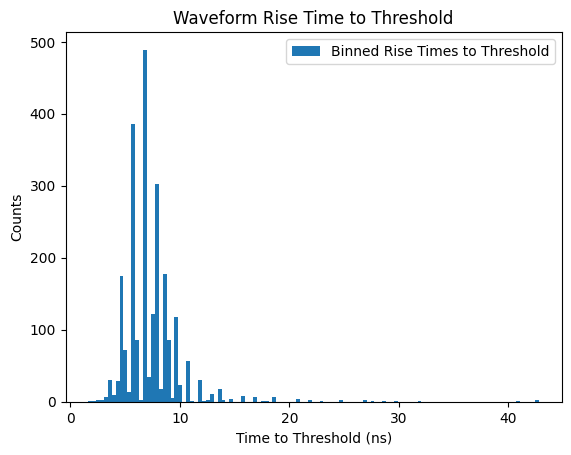

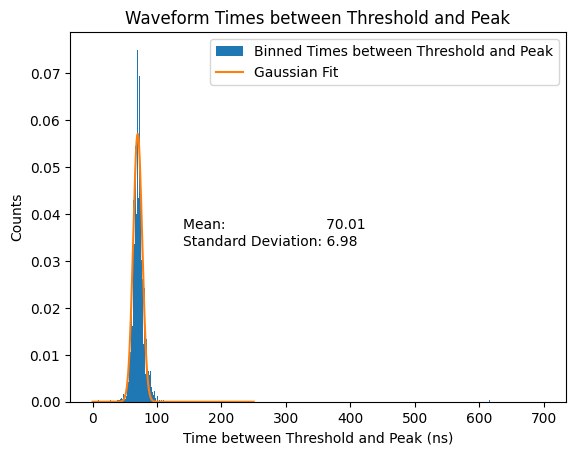

In [ ]:
for ch in range(3):
   visualize_waveforms(f"test_72/RAW/DataR_CH{ch}@DT5751_1616_test_72.root", thresh = 25, channel = ch)

# Varied ECG
### Test 65
| Parameter | Value |
| :--- | ---: |
| Duration | 600 s |
| Record Length | 996 ns |
| Pre-trigger | 96 ns |
| Threshold | 15 LSB |
| Trigger Holdoff | 896 ns |
| Energy Coarse Gain | 80 fC/LSB |
| Gate | 800 ns |
| Short Gate | 80 ns |
| Pre-Gate | 15 ns |
| Coincidence Window | 8 ns |

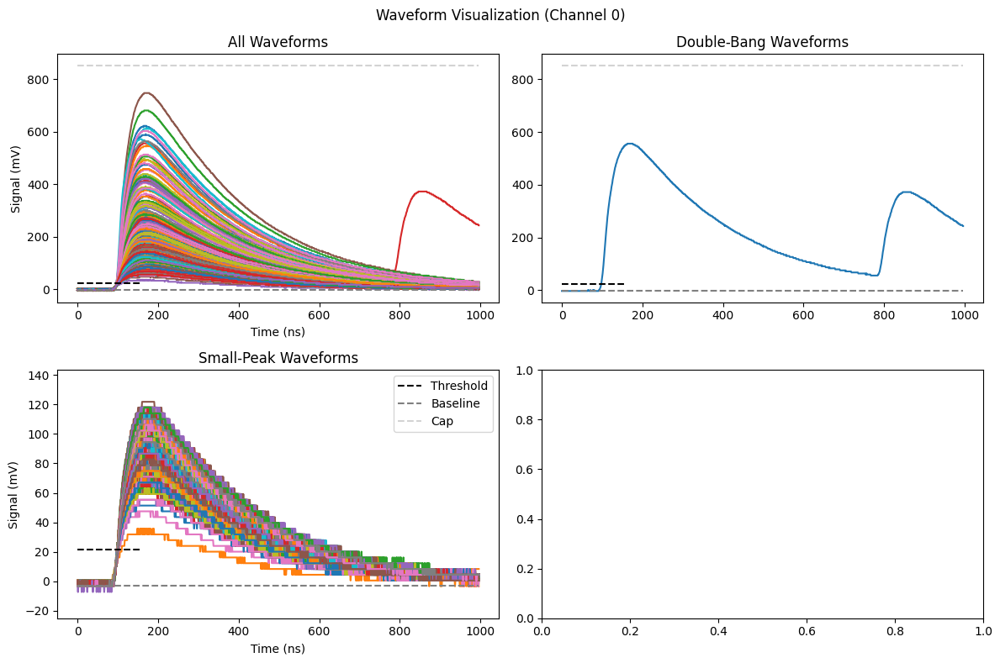

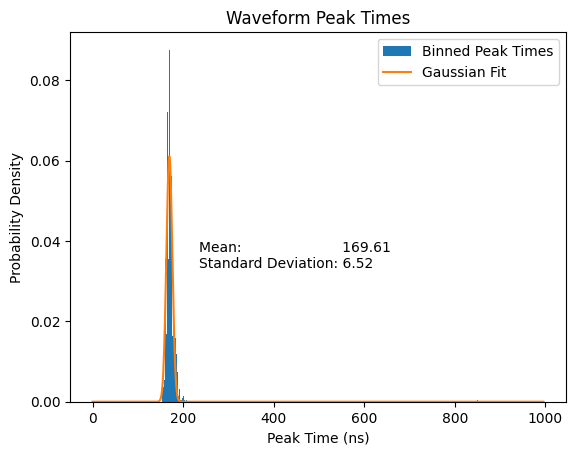

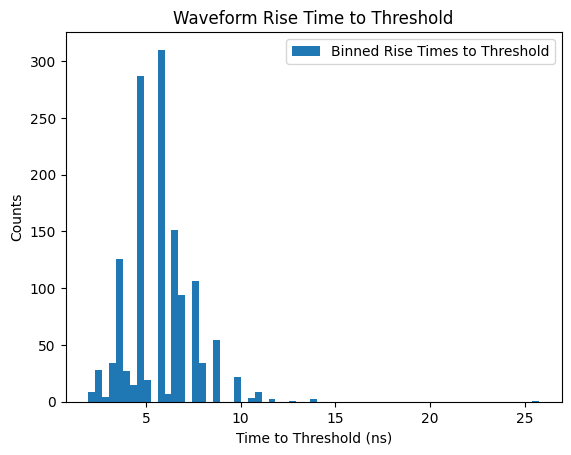

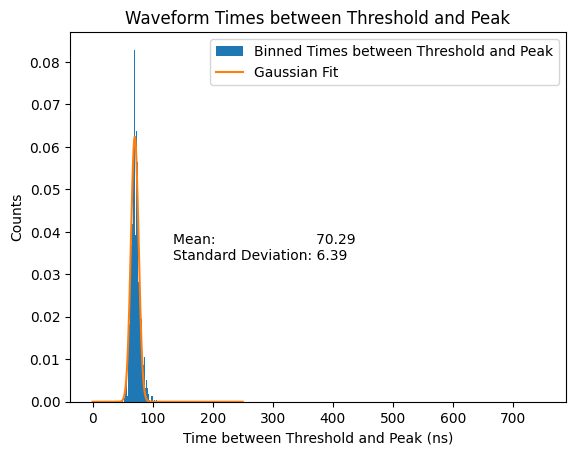

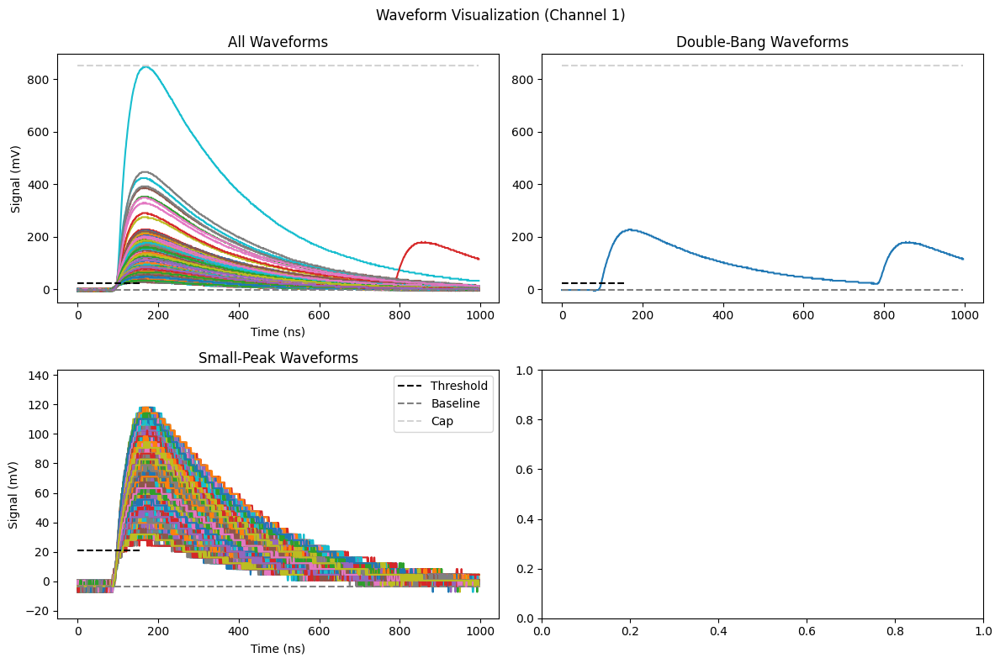

...

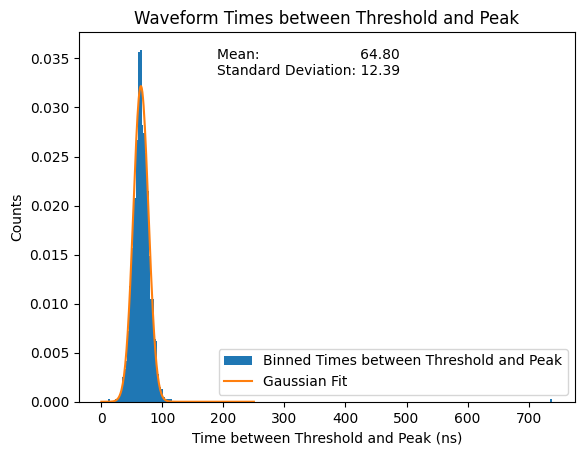

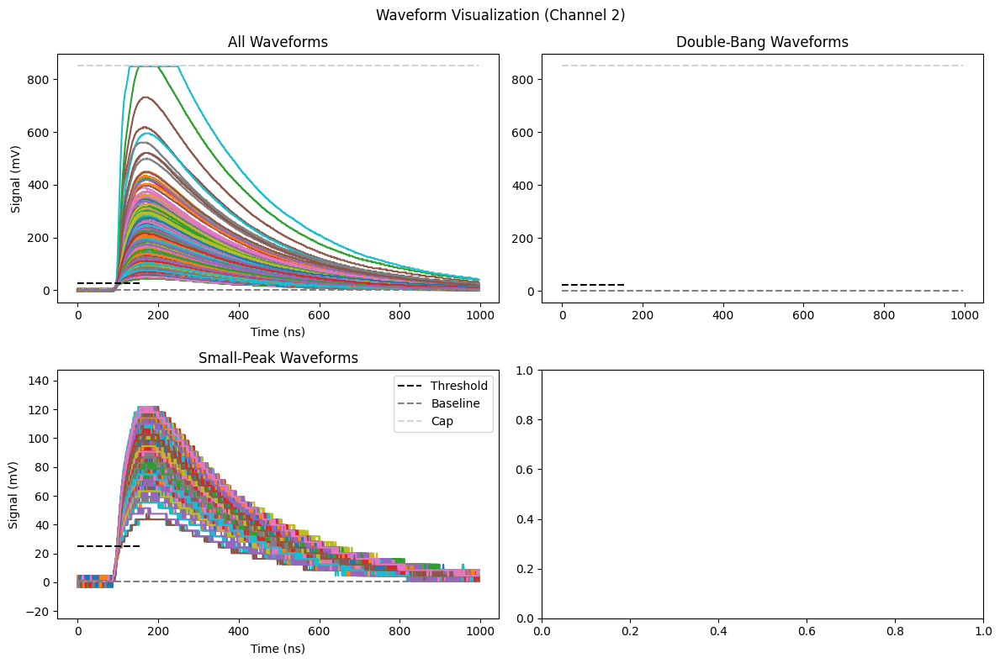

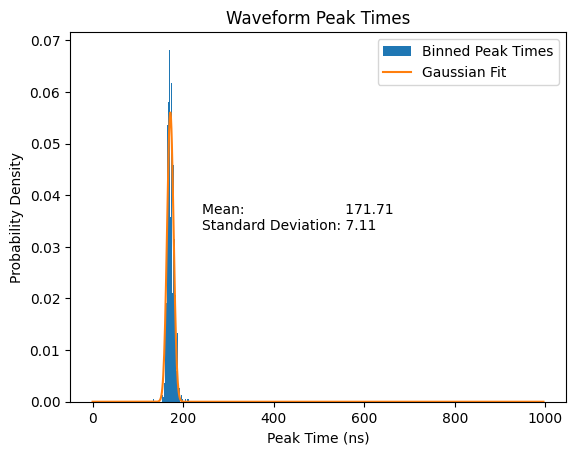

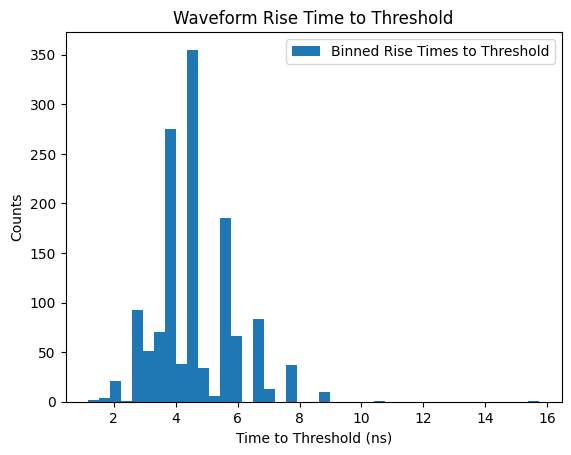

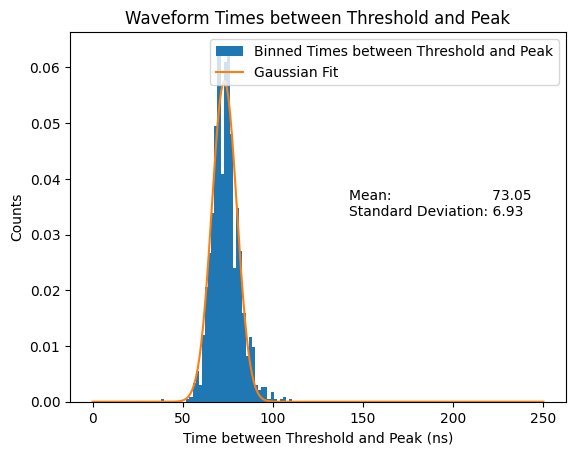

In [19]:
for ch in range(3):
   visualize_waveforms(f"test_65/RAW/DataR_CH{ch}@DT5751_1616_test_65.root", thresh = 25, channel = ch,digitizer_offset_pct=14.8)

### Test 76
| Parameter | Value |
| :--- | ---: |
| Duration | 600 s |
| Record Length | 996 ns |
| Pre-trigger | 96 ns |
| Threshold | 15 LSB |
| Trigger Holdoff | 896 ns |
| Energy Coarse Gain | 160 fC/LSB |
| Gate | 800 ns |
| Short Gate | 80 ns |
| Pre-Gate | 15 ns |
| Coincidence Window | 8 ns |

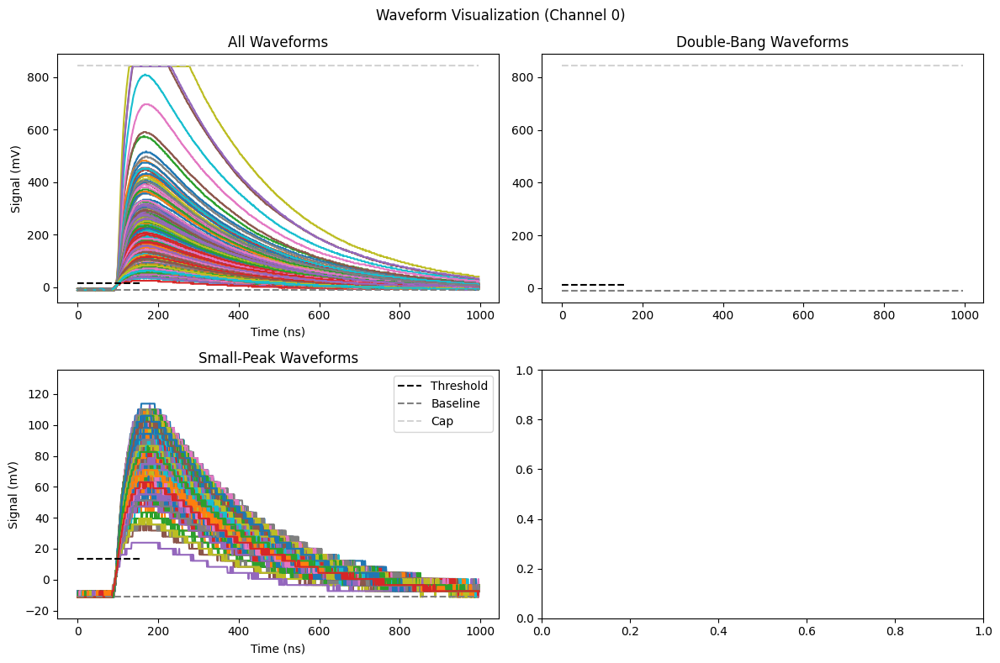

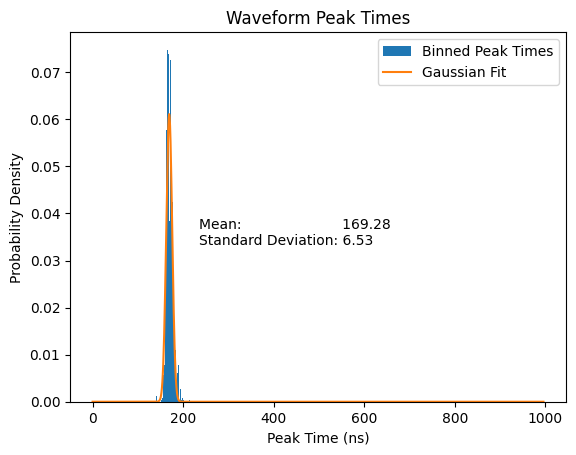

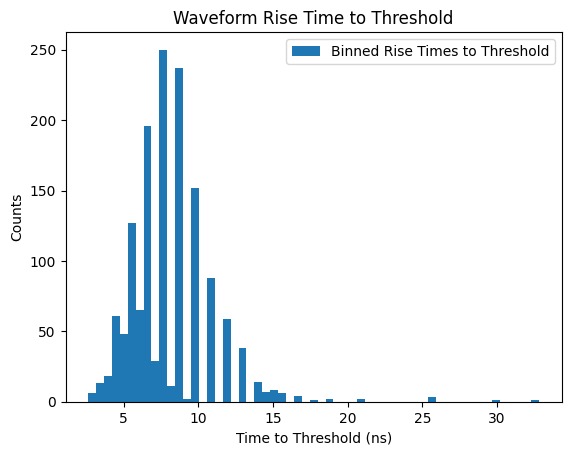

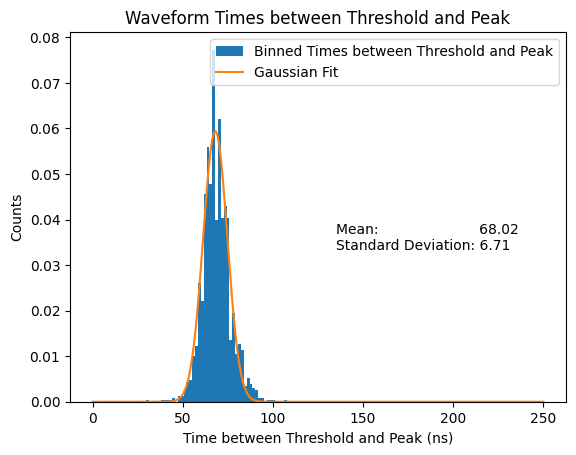

/Users/BEAVERMAN/PONE/mist-characterization-optimization/.venv/lib/python3.14/site-packages/scipy/optimize/_root_scalar.py:327: RuntimeWarning: Derivative was zero.
  r, sol = methodc(f, x0, args=args, fprime=fprime, fprime2=None,


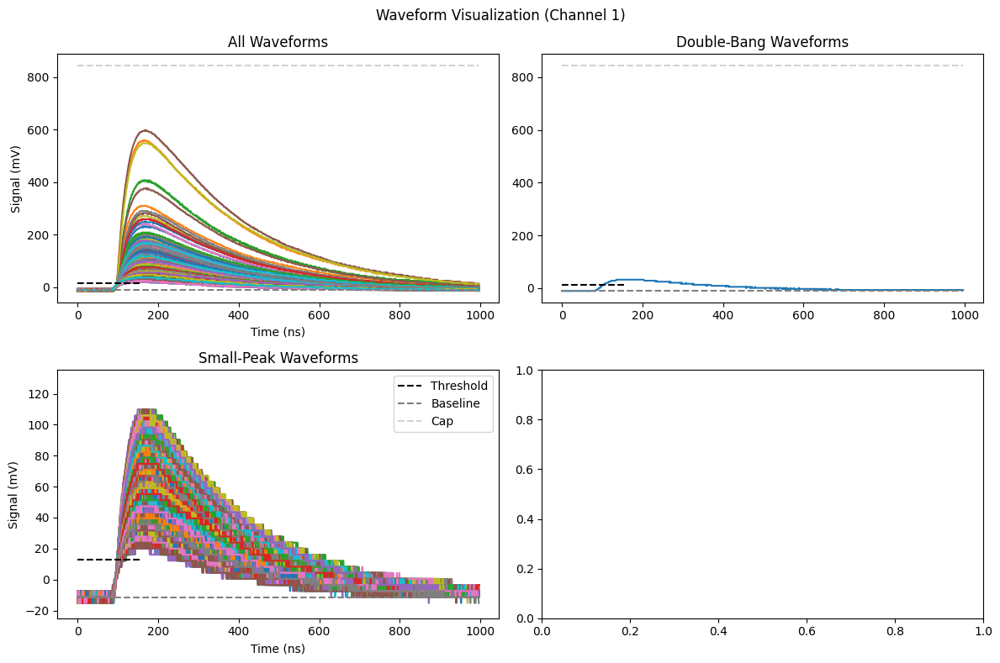

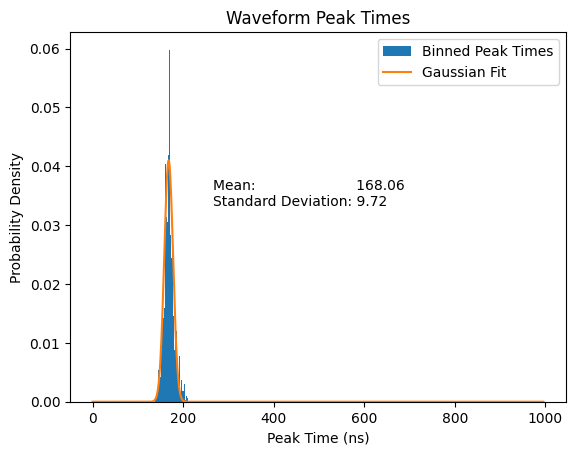

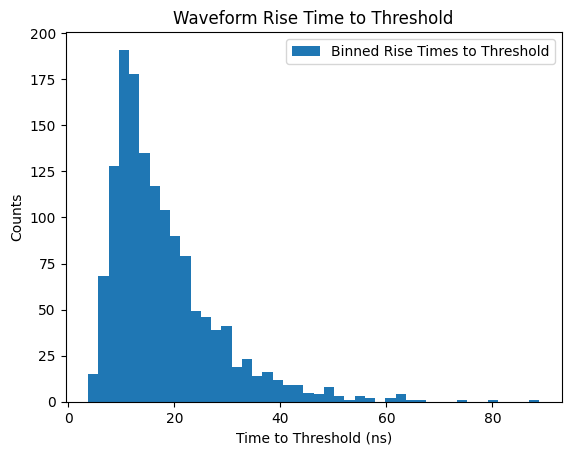

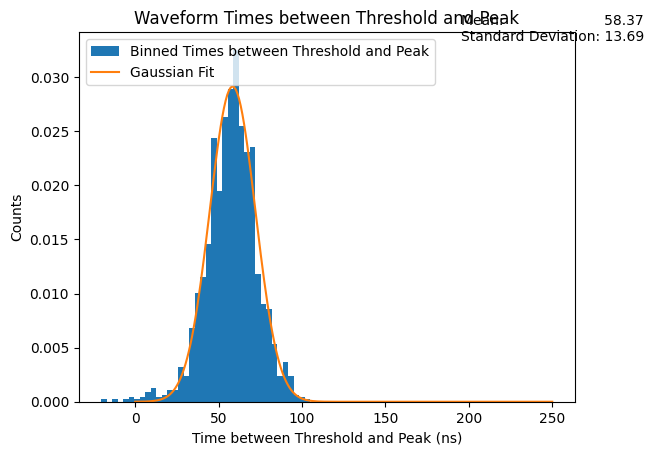

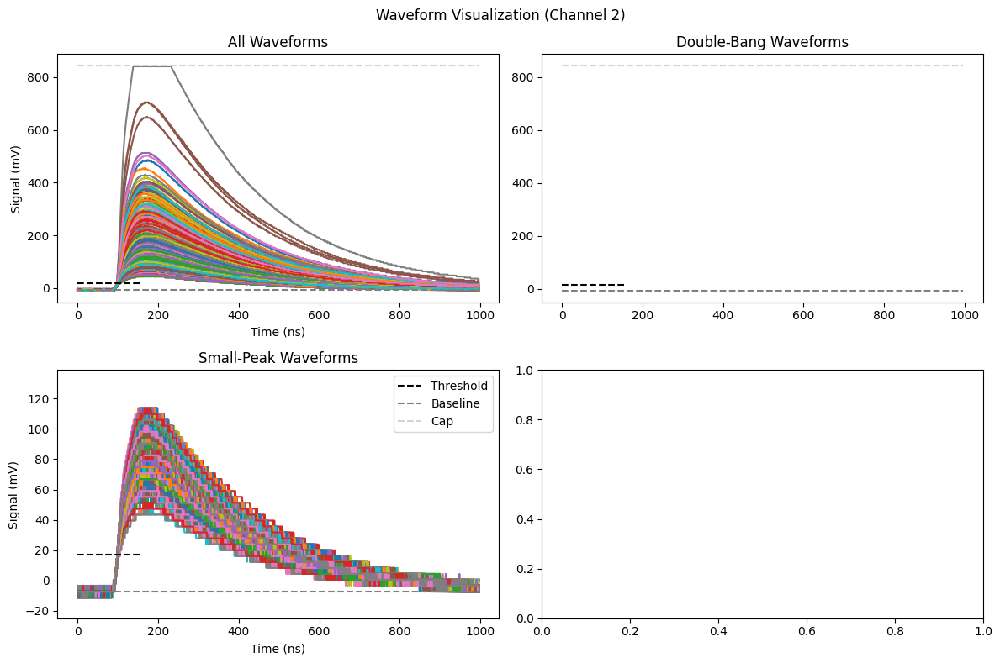

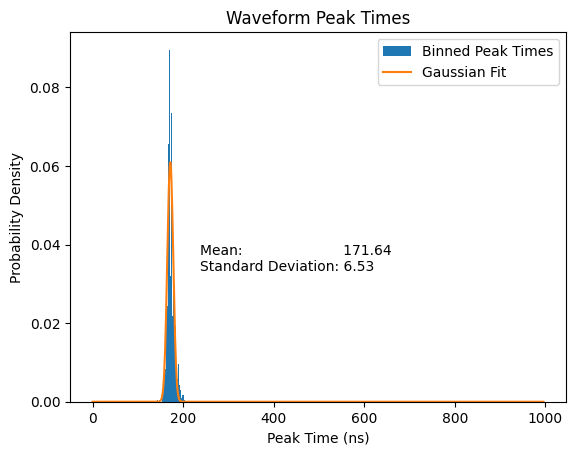

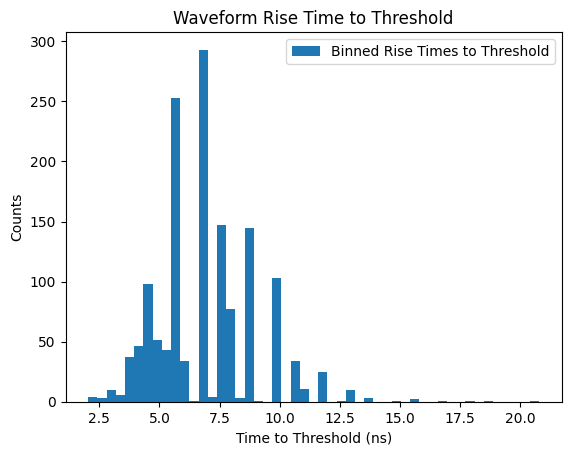

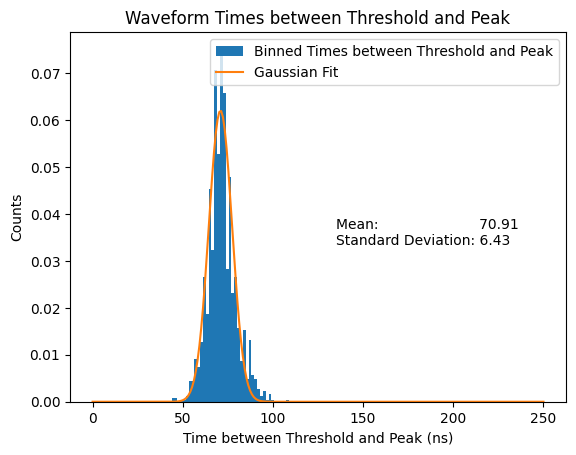

In [20]:
for ch in range(3):
   visualize_waveforms(f"test_76/RAW/DataR_CH{ch}@DT5751_1616_test_76.root", thresh = 25, channel = ch)

# Varied Digitizer Offset
### Test 79
| Parameter | Value |
| :--- | ---: |
| Duration | 600 s |
| Record Length | 996 ns |
| Pre-trigger | 96 ns |
| Threshold | 15 LSB |
| Trigger Holdoff | 896 ns |
| Energy Coarse Gain | 80 fC/LSB |
| Gate | 800 ns |
| Short Gate | 80 ns |
| Pre-Gate | 15 ns |
| Coincidence Window | 8 ns |
| Digitizer Offset | 15% |

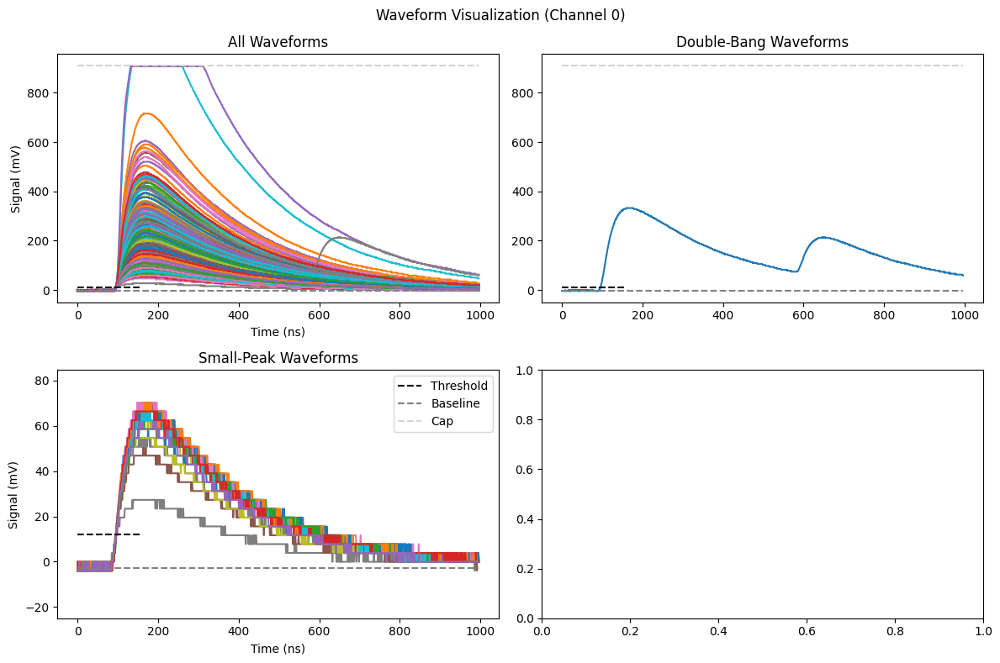

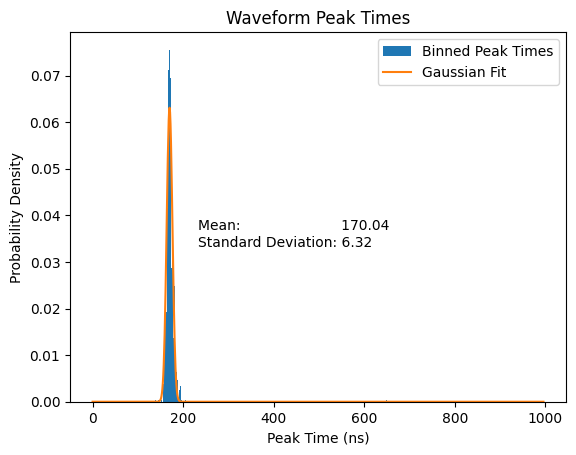

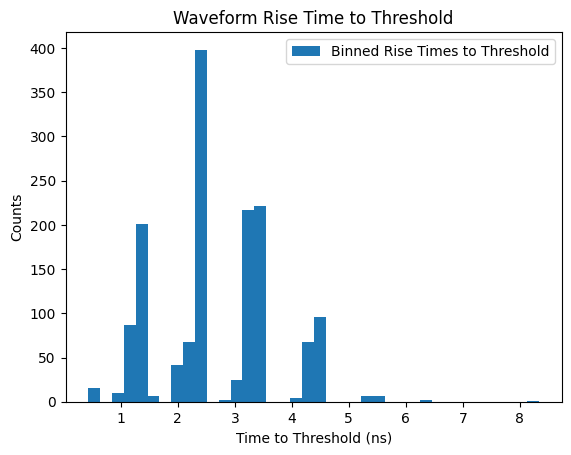

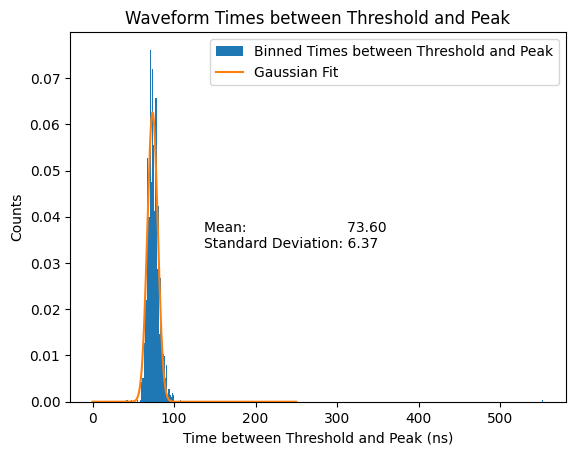

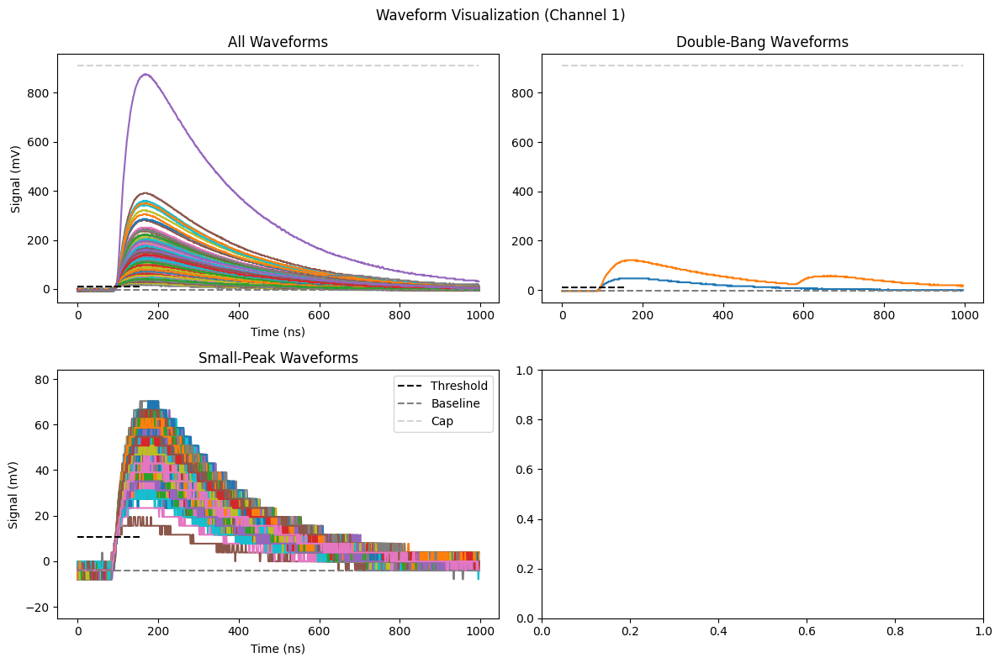

...

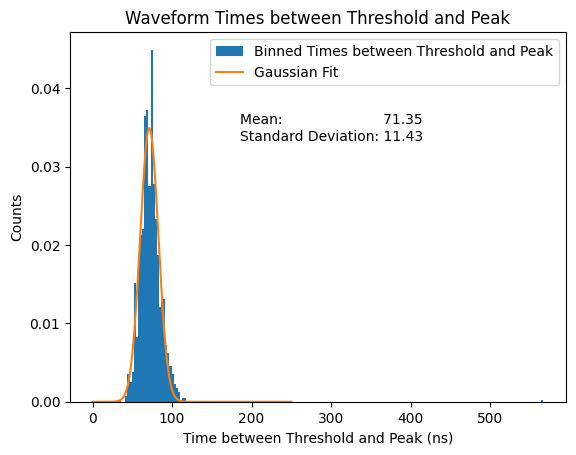

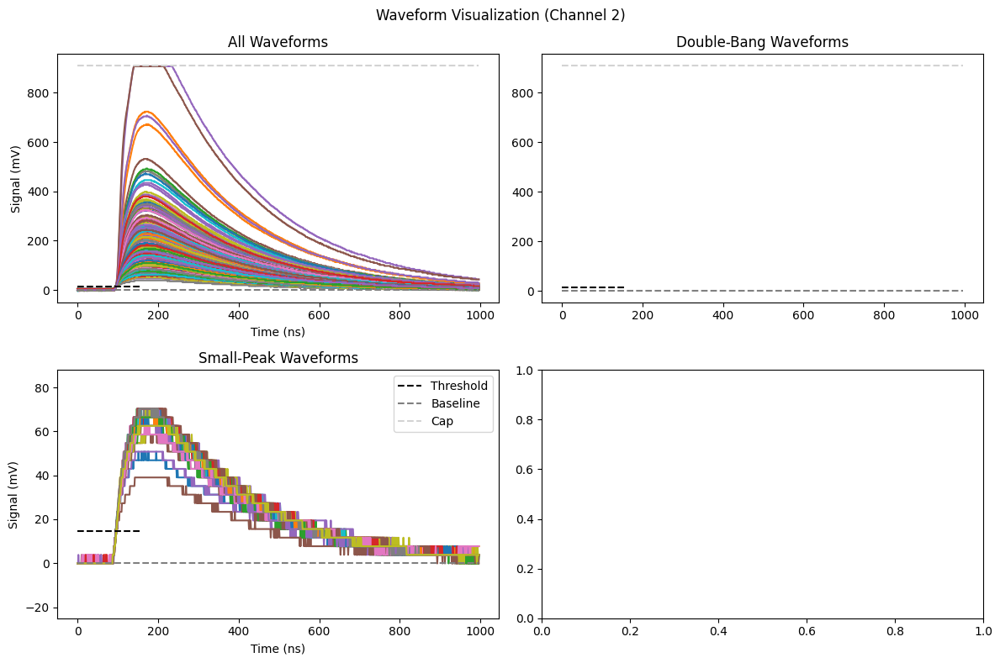

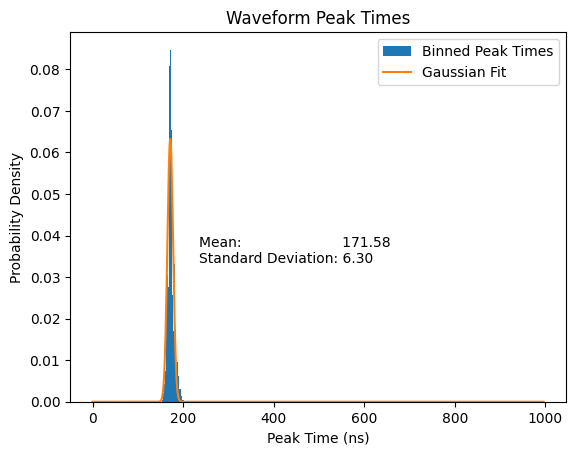

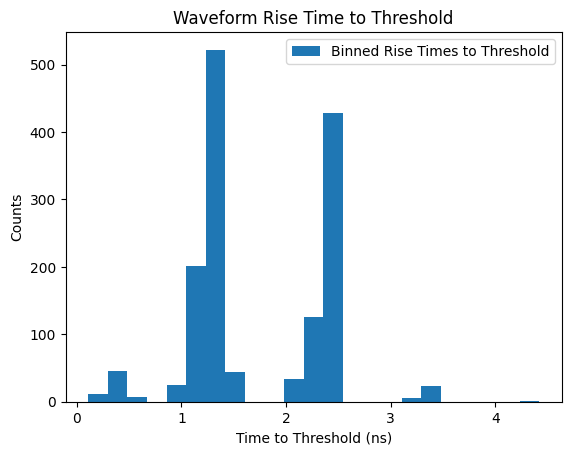

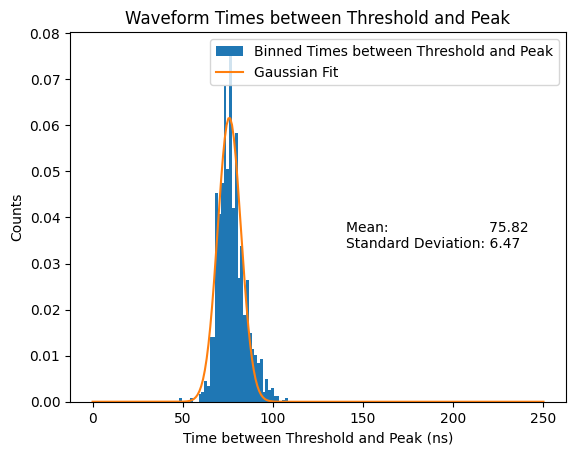

In [24]:
for ch in range(3):
   visualize_waveforms(f"test_79/RAW/DataR_CH{ch}@DT5751_1616_test_79.root", channel = ch, digitizer_offset_pct=9)

### Test 80
| Parameter | Value |
| :--- | ---: |
| Duration | 600 s |
| Record Length | 996 ns |
| Pre-trigger | 96 ns |
| Threshold | 15 LSB |
| Trigger Holdoff | 896 ns |
| Energy Coarse Gain | 80 fC/LSB |
| Gate | 800 ns |
| Short Gate | 80 ns |
| Pre-Gate | 15 ns |
| Coincidence Window | 8 ns |
| Digitizer Offset | 10% |

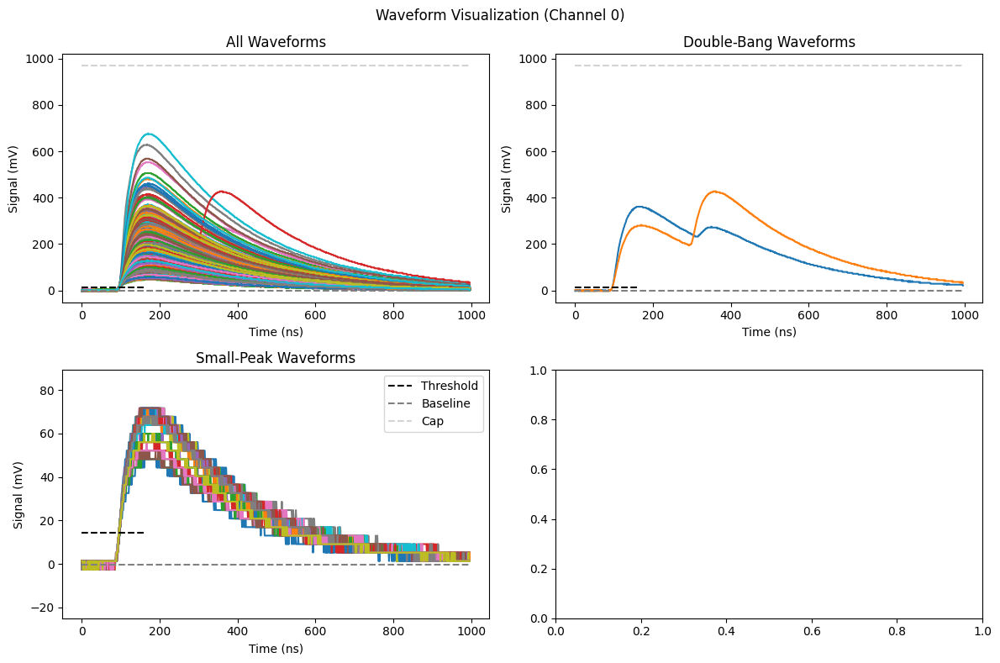

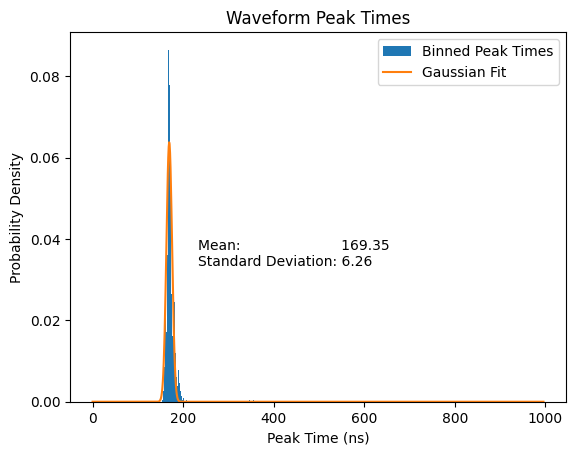

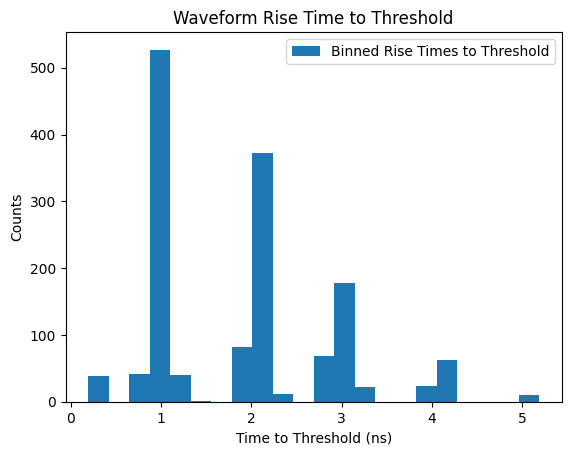

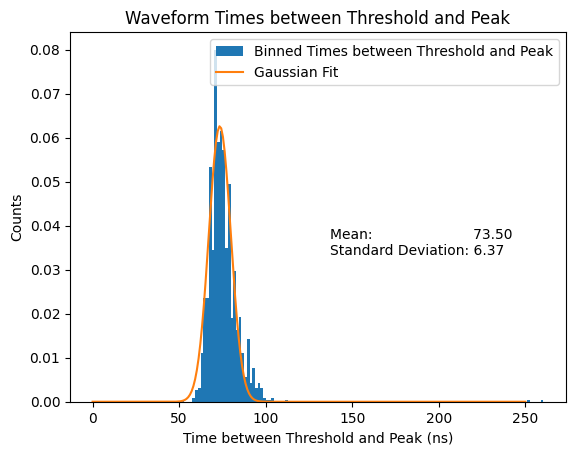

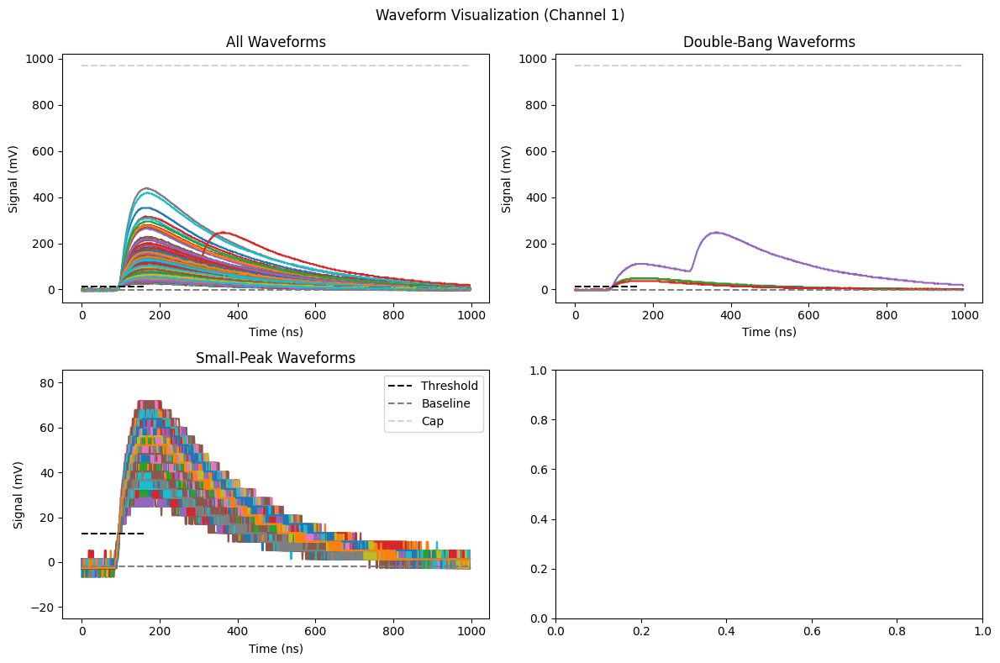

...

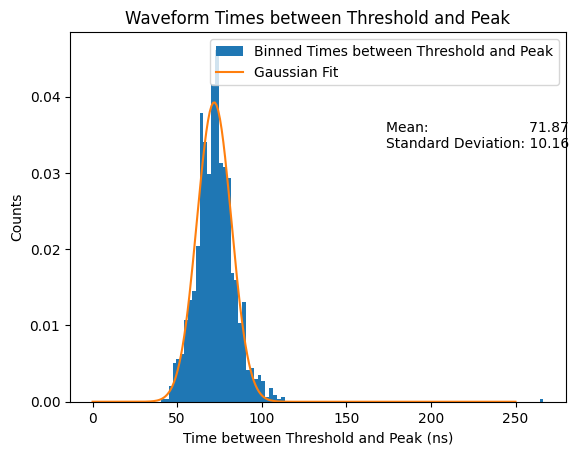

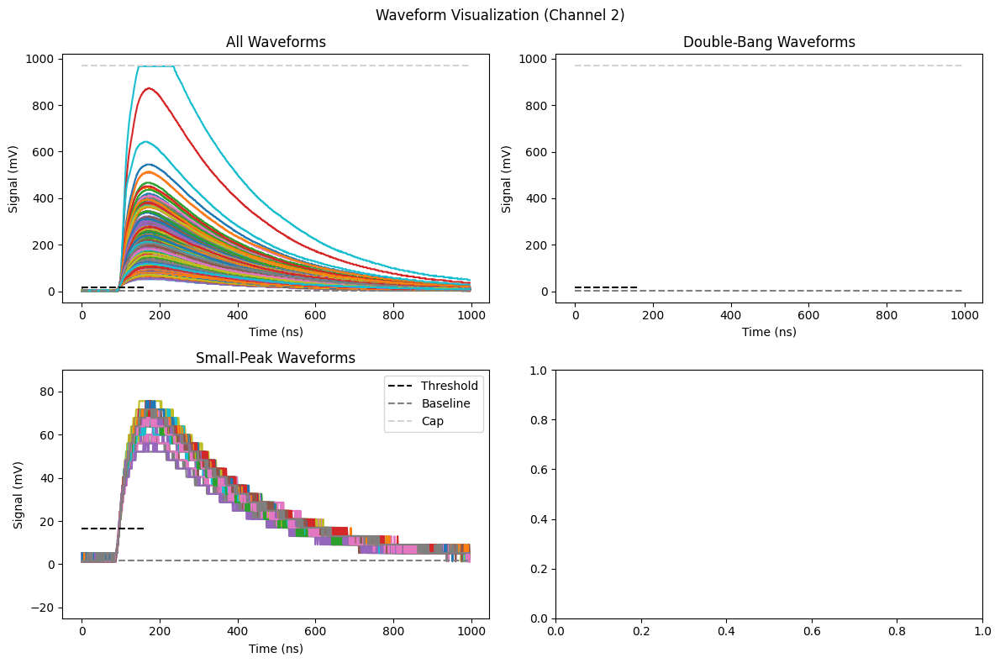

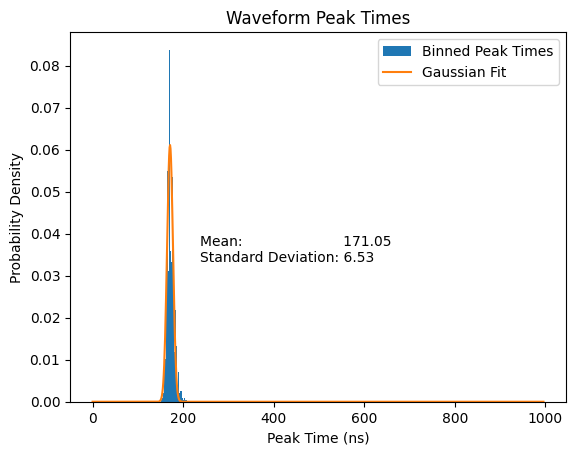

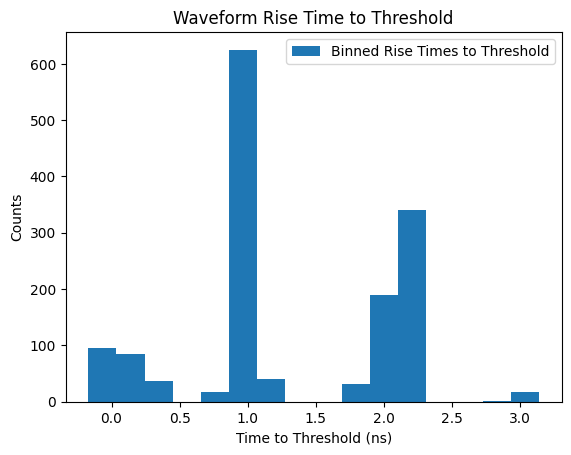

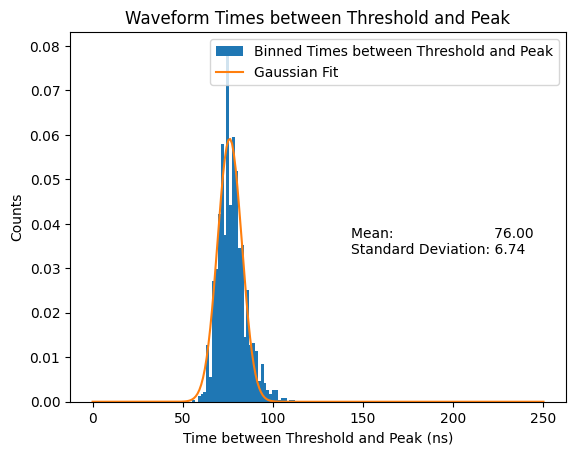

In [33]:
for ch in range(3):
   visualize_waveforms(f"test_80/RAW/DataR_CH{ch}@DT5751_1616_test_80.root", channel = ch, digitizer_offset_pct=3)

### Baseline with Coincidence Window of 16 ns

560 events detected
len(waves)  560


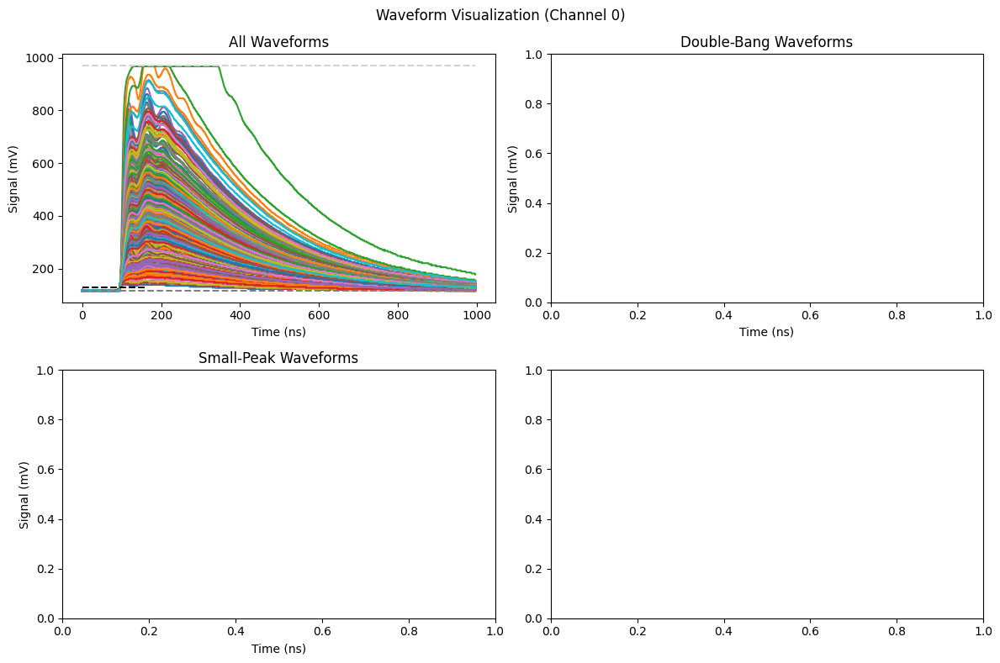

560 events detected
len(waves)  560


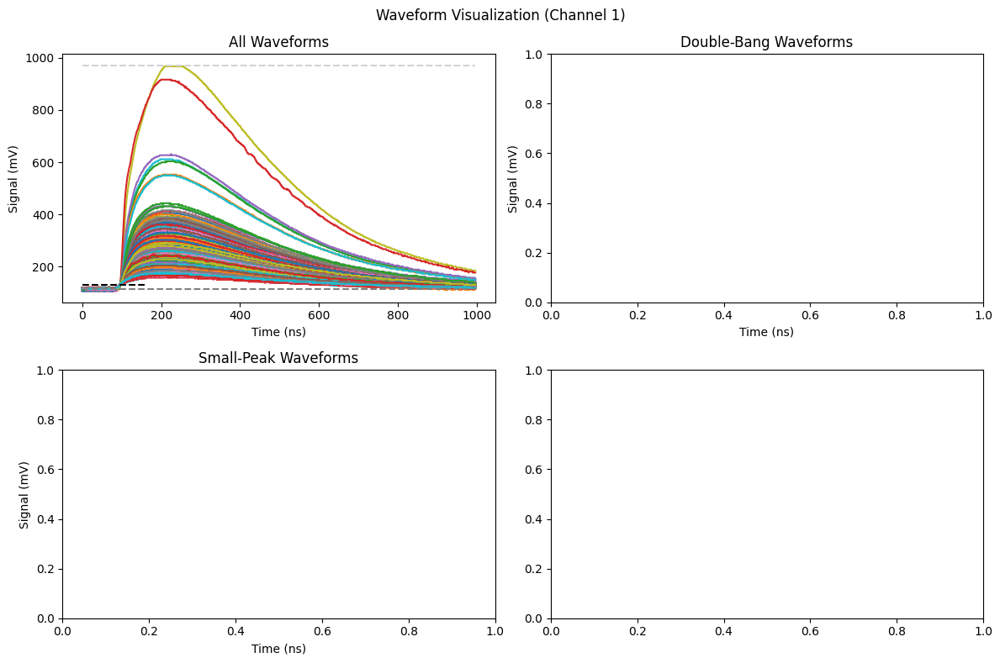

560 events detected
len(waves)  560


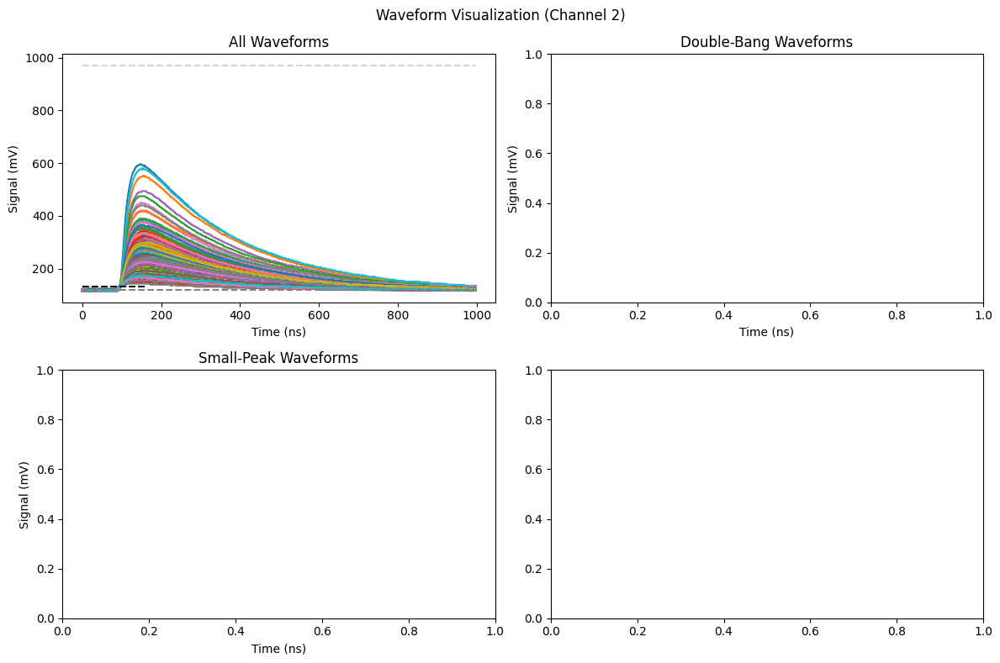

FileNotFoundError: [Errno 2] No such file or directory: '/Users/BEAVERMAN/PONE/mist-characterization-optimization/analysis/daq_settings/baseline_16ns_coincidence/RAW/DataR_CH3@DT5751_1616_baseline_16ns_coincidence.root'

In [8]:
for ch in range(4):
   visualize_waveforms(f"baseline_16ns_coincidence/RAW/DataR_CH{ch}@DT5751_1616_baseline_16ns_coincidence.root", channel = ch, digitizer_offset_pct=3, full_output=False)

### Baseline with Majority Level 2 and Coincidence Window of 16 ns

608 events detected
len(waves)  608


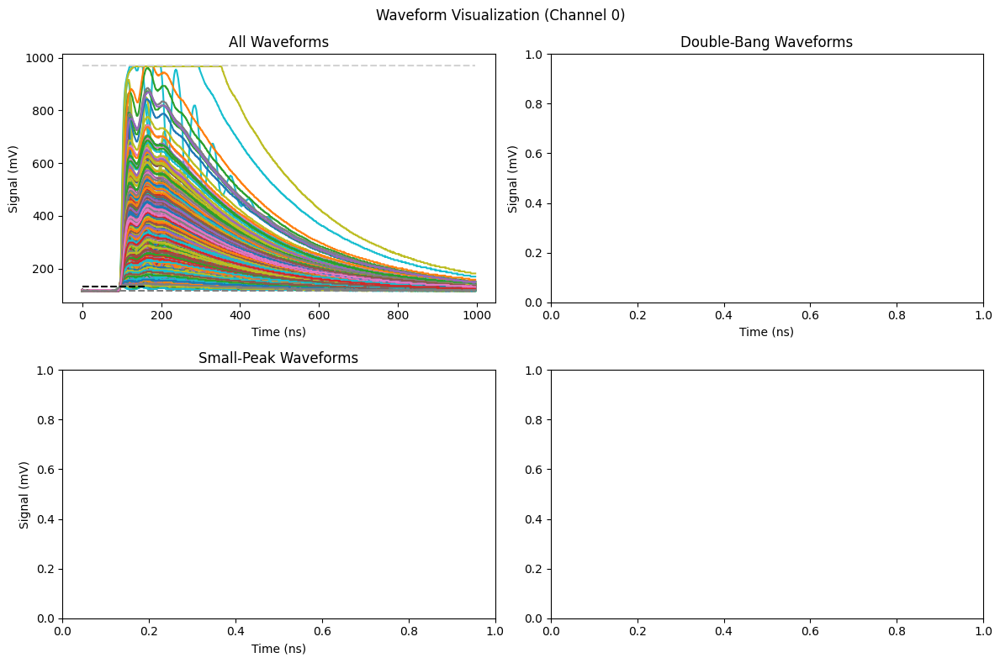

1040 events detected
len(waves)  1040


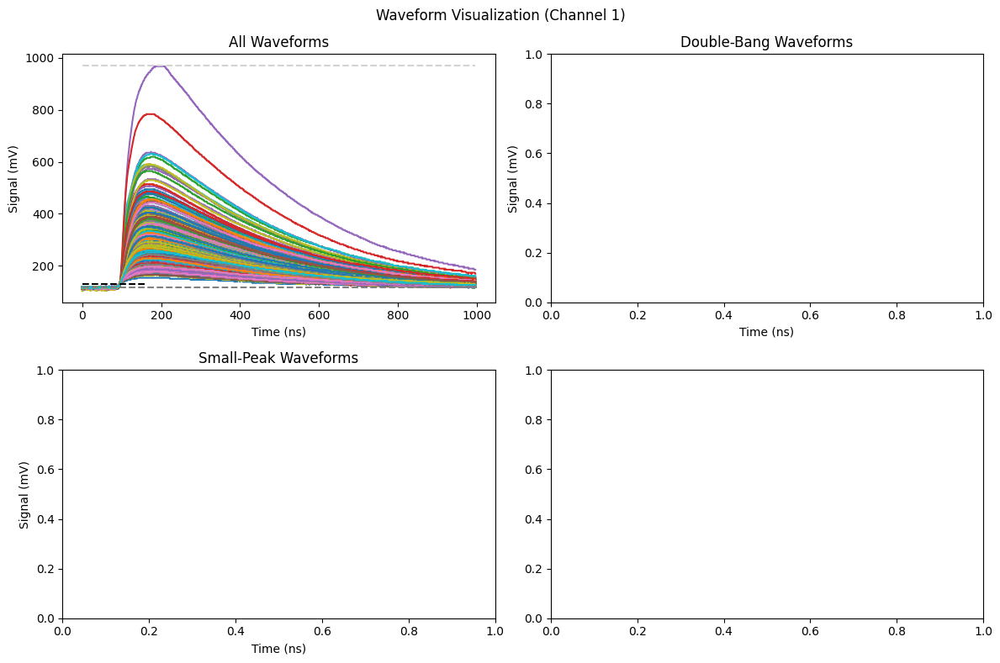

1040 events detected
len(waves)  1040


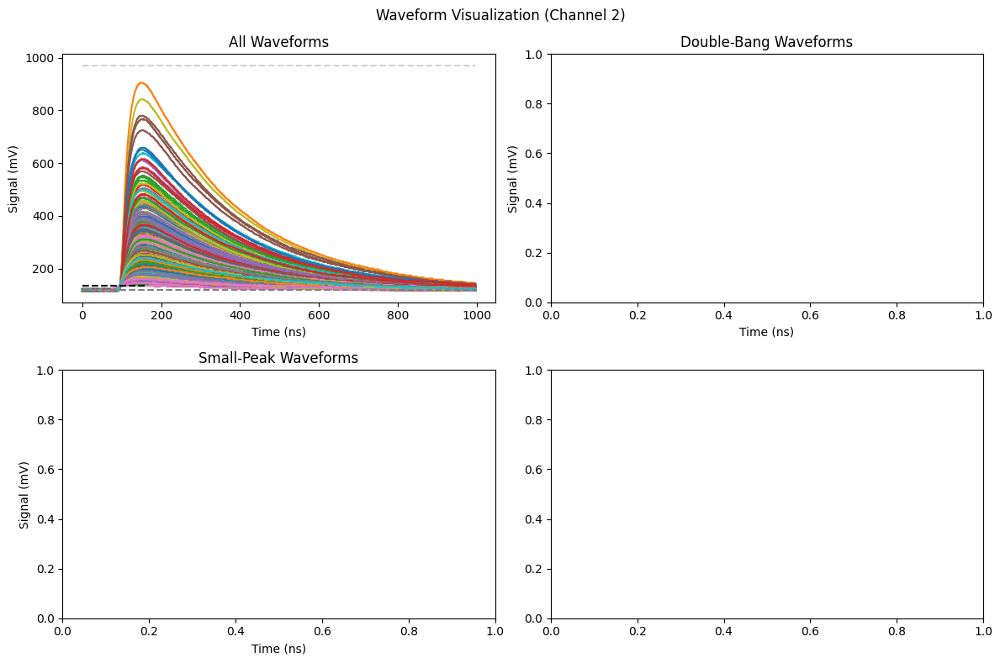

0 events detected
[WARNING] No events exist in baseline_16ns_majority/RAW/DataR_CH3@DT5751_1616_baseline_16ns_majority.root


In [9]:
for ch in range(4):
   visualize_waveforms(f"baseline_16ns_majority/RAW/DataR_CH{ch}@DT5751_1616_baseline_16ns_majority.root", channel = ch, digitizer_offset_pct=3, full_output=False)